In [5]:
import math
import numpy as np

import matplotlib.pyplot as plt
import skimage.transform as sktr

import skimage as sk

import skimage.io as skio
import cv2
from scipy.spatial import Delaunay


In [6]:
#select points
def get_points(im1, im2):
    plt.imshow(im1, cmap = 'gray')
    pts1 = np.asarray(plt.ginput(71, timeout = 0))
    plt.close()
    plt.imshow(im2, cmap = 'gray')
    pts2 = np.asarray(plt.ginput(71, timeout = 0))
    plt.close()
    return (pts1, pts2)

(435, 400, 3)
(435, 400, 3)


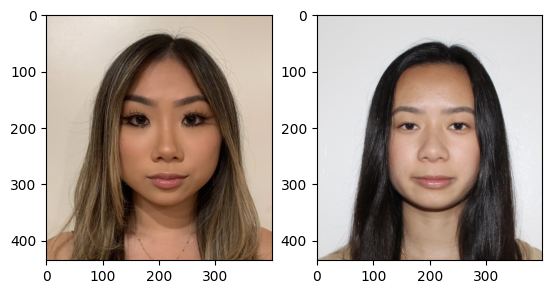

In [8]:
#load images and resize
han = skio.imread("han1.jpg")/255
jenny = skio.imread("jenny.jpg")/255
han = han[80:, 50:850]
jenny = jenny[8:, :800]
han = cv2.resize(han, (400, 435))
jenny = cv2.resize(jenny, (400, 435))
han = sk.img_as_float(han)
# print(han)

print(han.shape)
print(jenny.shape)



plt.subplot(121); plt.imshow(han);
plt.subplot(122); plt.imshow(jenny);

In [9]:
# %matplotlib tk

In [10]:
#click correspondence points
# pts = get_points(han, jenny)
# np.savetxt("han_pts.txt", pts[0])
# np.savetxt("jen_pts.txt", pts[1])

# pts1 = pts[0]
# pts2 = pts[1]

pts1 = np.loadtxt("han_pts.txt")
pts2 = np.loadtxt("jen_pts.txt")


print("pts1", pts1)
print("pts2", pts2)



pts1 [[134.70854146 196.19330669]
 [151.19205794 184.20529471]
 [170.67257742 199.19030969]
 [150.44280719 204.43506494]
 [225.36788212 199.19030969]
 [246.3469031  181.95754246]
 [265.82742258 192.44705295]
 [246.3469031  203.68581419]
 [190.1530969  203.68581419]
 [190.1530969  233.65584416]
 [174.41883117 253.13636364]
 [173.66958042 266.62287712]
 [180.41283716 272.61688312]
 [188.6545954  267.37212787]
 [196.1471029  270.36913087]
 [207.38586414 271.11838162]
 [214.87837163 266.62287712]
 [223.86938062 272.61688312]
 [229.86338661 265.12437562]
 [224.61863137 251.63786214]
 [213.37987013 234.40509491]
 [207.38586414 202.93656344]
 [130.96228771 145.99350649]
 [146.69655345 147.49200799]
 [162.43081918 151.23826174]
 [181.91133866 157.23226773]
 [178.91433566 169.96953047]
 [161.68156843 162.47702298]
 [145.9473027  157.98151848]
 [128.71453546 155.73376623]
 [212.63061938 158.73076923]
 [226.86638362 154.23526474]
 [241.8513986  148.99050949]
 [261.33191808 148.99050949]
 [266.576

In [11]:
%matplotlib inline

In [12]:
def avg_points(arr1, arr2):
    avgarr = []
    for i in range(len(arr1)):
        avg = (arr1[i]+ arr2[i])/2
        avgarr.append(avg)
    return np.asarray(avgarr)

In [14]:
averages = avg_points(pts1, pts2)


In [15]:
avg_tri = Delaunay(averages)

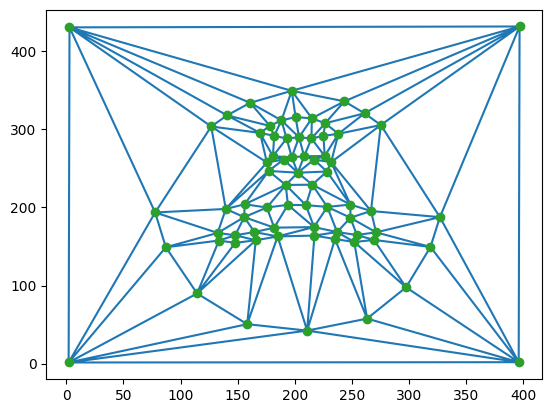

In [16]:
plt.triplot(averages[:,0], averages[:,1], avg_tri.simplices)
mid = plt.plot(averages[:,0], averages[:,1], 'o')
plt.show()

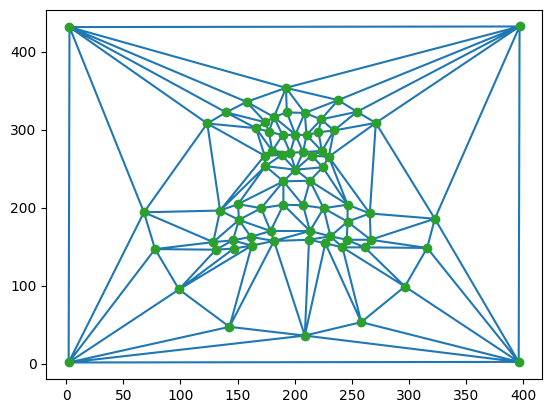

In [17]:
plt.triplot(pts1[:,0], pts1[:,1], avg_tri.simplices)
h = plt.plot(pts1[:,0], pts1[:,1], 'o')
plt.show()


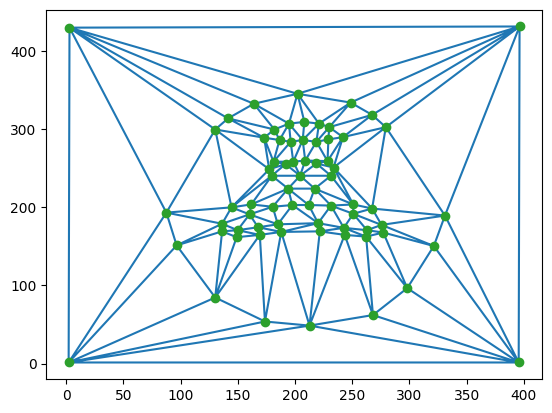

In [18]:
plt.triplot(pts2[:,0], pts2[:,1], avg_tri.simplices)
j = plt.plot(pts2[:,0], pts2[:,1], 'o')
plt.show()


In [19]:
#get triangulation coordinates
avg_triangles = averages[avg_tri.simplices]
pts1_triangles = pts1[avg_tri.simplices]
pts2_triangles = pts2[avg_tri.simplices]


In [20]:
#get affine transform for a single triangle
def compute_affine(source_tri, dest_tri):
    ones = np.array([[1],[1],[1]])
    arr1 = np.hstack((source_tri, ones))
    arr1 = np.asarray(arr1)
    
    arr_dest  = np.hstack((dest_tri, ones))
    arr_dest = np.asarray(arr_dest)
    
    forward_affine = np.linalg.solve(arr1, arr_dest)
    return forward_affine

In [21]:
#compute transition matrices for each of the triangles in pts1 and pts1 (source -> destination)
pts1_transform = []
pts2_transform = []
for i in range(len(pts1_triangles)):
    pts1_transform.append(compute_affine(pts1_triangles[i], avg_triangles[i]))
    pts2_transform.append(compute_affine(pts2_triangles[i], avg_triangles[i]))

In [22]:
#get inverses of transformation matrices for pts 1 (destination -> source)
pt1_inverses = []
pt2_inverses = []
for i in range(len(pts1_transform)):
    pt1_inverses.append(np.linalg.inv(pts1_transform[i]))
    pt2_inverses.append(np.linalg.inv(pts2_transform[i]))


In [23]:
from skimage.draw import polygon

#get all points inside single triangle (Remember: column = x, row = y)
def get_inside_pts(tri_coords):
    r = []
    c = []
    for i in range(3):
        r.append(tri_coords[i][1])
        c.append(tri_coords[i][0])
    r = np.asarray(r)
    c = np.asarray(c)
    rr, cc = polygon(r,c)
    return list(zip(cc, rr))

In [24]:
#get points in each avg triangle
pts_inside_avg_triangle = []
for i in range(len(avg_triangles)):
    pts_inside_avg_triangle.append(get_inside_pts(avg_triangles[i]))

In [26]:
#append 1 to each of the points within the triangles
for i in range(len(pts_inside_avg_triangle)): #loops through all arrays
    for j in range(len(pts_inside_avg_triangle[i])):
        pts_inside_avg_triangle[i][j] = [pts_inside_avg_triangle[i][j][0],pts_inside_avg_triangle[i][j][1],1]

In [27]:
#make points inside avg triangle into matrix we can multiply by transformation matrix
stacked_arrays = []
for i in pts_inside_avg_triangle: 
    stacked_arrays.append(np.stack(i))

In [28]:
#multiply points in avg triangles by inverse matrix of each triangle for pts1 and pts2 to get orig pixel location 
orig_pixel_pts1 = []
orig_pixel_pts2 = []
for i in range(len(stacked_arrays)):
    inv = pt1_inverses[i]
    inv2 = pt2_inverses[i]
    orig_pixel_pts1.append(np.dot(stacked_arrays[i], inv))
    orig_pixel_pts2.append(np.dot(stacked_arrays[i], inv2))

In [29]:
from scipy.interpolate import RectBivariateSpline

def interpolate(im1, im2):
    (R1, G1, B1) = cv2.split(im1)
    f_R1channel = RectBivariateSpline(np.arange(im1.shape[0]), np.arange(im1.shape[1]), R1)
    f_G1channel = RectBivariateSpline(np.arange(im1.shape[0]), np.arange(im1.shape[1]), G1)
    f_B1channel = RectBivariateSpline(np.arange(im1.shape[0]), np.arange(im1.shape[1]), B1)
    
    (R2, G2, B2) = cv2.split(im2)
    f_R2channel = RectBivariateSpline(np.arange(im2.shape[0]), np.arange(im2.shape[1]), R2)
    f_G2channel = RectBivariateSpline(np.arange(im2.shape[0]), np.arange(im2.shape[1]), G2)
    f_B2channel = RectBivariateSpline(np.arange(im2.shape[0]), np.arange(im2.shape[1]), B2)
    
    return f_R1channel,f_R2channel,f_G1channel,f_G2channel,f_B1channel,f_B2channel


In [31]:
f_R1 ,f_R2 ,f_G1 ,f_G2 ,f_B1 ,f_B2 = interpolate(han, jenny)

avg_img = han.copy()

for i in range(len(orig_pixel_pts1)):
    for j in range(len(orig_pixel_pts1[i])):
        print(orig_pixel_pts1[i][j])
        forward_transf = pts1_transform[i]
        forward_transf2 = pts2_transform[i]
        avg_pixel_location = np.rint(np.dot(orig_pixel_pts1[i][j], forward_transf))
        avg_pixel_location2 = np.rint(np.dot(orig_pixel_pts2[i][j], forward_transf2))
        print(avg_pixel_location)

#pixel locations to add the color to in midpoint image
        pixel_x = avg_pixel_location[0]
        pixel_y = avg_pixel_location[1]
#call each interpolation function on x, y coord for all the points mapped to in both original images
        r1, g1, b1 = f_R1(orig_pixel_pts1[i][j][1], orig_pixel_pts1[i][j][0]), f_G1(orig_pixel_pts1[i][j][1], orig_pixel_pts1[i][j][0]), f_B1(orig_pixel_pts1[i][j][1], orig_pixel_pts1[i][j][0])
        r2, g2, b2 = f_R2(orig_pixel_pts2[i][j][1], orig_pixel_pts2[i][j][0]), f_G2(orig_pixel_pts2[i][j][1], orig_pixel_pts2[i][j][0]), f_B2(orig_pixel_pts2[i][j][1], orig_pixel_pts2[i][j][0])
#take avg of pixel colors        
        avg_img[int(pixel_y)][int(pixel_x)][0] = (r1+r2)/2
        avg_img[int(pixel_y)][int(pixel_x)][1] = (g1+g2)/2
        avg_img[int(pixel_y)][int(pixel_x)][2] = (b1+b2)/2


# plt.imshow(avg_img);


# skio.imsave('/Users/amrita/cs194-26/proj3/midway_face.jpg', avg_img)


[5.97271376 1.90543225 1.        ]
[6. 2. 1.]
[6.97371374 1.90653749 1.        ]
[7. 2. 1.]
[7.97471373 1.90764274 1.        ]
[8. 2. 1.]
[8.97571371 1.90874798 1.        ]
[9. 2. 1.]
[9.97671369 1.90985323 1.        ]
[10.  2.  1.]
[10.97771367  1.91095847  1.        ]
[11.  2.  1.]
[11.97871366  1.91206371  1.        ]
[12.  2.  1.]
[12.97971364  1.91316896  1.        ]
[13.  2.  1.]
[13.98071362  1.9142742   1.        ]
[14.  2.  1.]
[14.9817136   1.91537944  1.        ]
[15.  2.  1.]
[15.98271359  1.91648469  1.        ]
[16.  2.  1.]
[16.98371357  1.91758993  1.        ]
[17.  2.  1.]
[17.98471355  1.91869518  1.        ]
[18.  2.  1.]
[18.98571353  1.91980042  1.        ]
[19.  2.  1.]
[19.98671352  1.92090566  1.        ]
[20.  2.  1.]
[20.9877135   1.92201091  1.        ]
[21.  2.  1.]
[21.98871348  1.92311615  1.        ]
[22.  2.  1.]
[22.98971346  1.92422139  1.        ]
[23.  2.  1.]
[23.99071345  1.92532664  1.        ]
[24.  2.  1.]
[24.99171343  1.92643188  1.        ]
[

[376.18976258   4.82953885   1.        ]
[376.   5.   1.]
[377.19076257   4.83064409   1.        ]
[377.   5.   1.]
[378.19176255   4.83174933   1.        ]
[378.   5.   1.]
[379.19276253   4.83285458   1.        ]
[379.   5.   1.]
[380.19376251   4.83395982   1.        ]
[380.   5.   1.]
[381.1947625    4.83506506   1.        ]
[381.   5.   1.]
[25.78878716  5.28109233  1.        ]
[26.  6.  1.]
[26.78978715  5.28219757  1.        ]
[27.  6.  1.]
[27.79078713  5.28330281  1.        ]
[28.  6.  1.]
[28.79178711  5.28440806  1.        ]
[29.  6.  1.]
[29.79278709  5.2855133   1.        ]
[30.  6.  1.]
[30.79378708  5.28661855  1.        ]
[31.  6.  1.]
[31.79478706  5.28772379  1.        ]
[32.  6.  1.]
[32.79578704  5.28882903  1.        ]
[33.  6.  1.]
[33.79678702  5.28993428  1.        ]
[34.  6.  1.]
[34.79778701  5.29103952  1.        ]
[35.  6.  1.]
[35.79878699  5.29214476  1.        ]
[36.  6.  1.]
[36.79978697  5.29325001  1.        ]
[37.  6.  1.]
[37.80078695  5.29435525  1.

[139.69885892   8.76064532   1.        ]
[140.  10.   1.]
[140.6998589    8.76175056   1.        ]
[141.  10.   1.]
[141.70085888   8.7628558    1.        ]
[142.  10.   1.]
[142.70185886   8.76396105   1.        ]
[143.  10.   1.]
[143.70285885   8.76506629   1.        ]
[144.  10.   1.]
[144.70385883   8.76617154   1.        ]
[145.  10.   1.]
[145.70485881   8.76727678   1.        ]
[146.  10.   1.]
[146.70585879   8.76838202   1.        ]
[147.  10.   1.]
[147.70685878   8.76948727   1.        ]
[148.  10.   1.]
[148.70785876   8.77059251   1.        ]
[149.  10.   1.]
[149.70885874   8.77169775   1.        ]
[150.  10.   1.]
[150.70985872   8.772803     1.        ]
[151.  10.   1.]
[151.71085871   8.77390824   1.        ]
[152.  10.   1.]
[152.71185869   8.77501349   1.        ]
[153.  10.   1.]
[153.71285867   8.77611873   1.        ]
[154.  10.   1.]
[154.71385865   8.77722397   1.        ]
[155.  10.   1.]
[155.71485864   8.77832922   1.        ]
[156.  10.   1.]
[156.71585862 

[276.47898558  14.78078531   1.        ]
[277.  17.   1.]
[277.47998556  14.78189056   1.        ]
[278.  17.   1.]
[278.48098555  14.7829958    1.        ]
[279.  17.   1.]
[279.48198553  14.78410105   1.        ]
[280.  17.   1.]
[280.48298551  14.78520629   1.        ]
[281.  17.   1.]
[281.48398549  14.78631153   1.        ]
[282.  17.   1.]
[282.48498548  14.78741678   1.        ]
[283.  17.   1.]
[283.48598546  14.78852202   1.        ]
[284.  17.   1.]
[284.48698544  14.78962726   1.        ]
[285.  17.   1.]
[285.48798542  14.79073251   1.        ]
[286.  17.   1.]
[286.48898541  14.79183775   1.        ]
[287.  17.   1.]
[287.48998539  14.792943     1.        ]
[288.  17.   1.]
[288.49098537  14.79404824   1.        ]
[289.  17.   1.]
[289.49198535  14.79515348   1.        ]
[290.  17.   1.]
[290.49298534  14.79625873   1.        ]
[291.  17.   1.]
[291.49398532  14.79736397   1.        ]
[292.  17.   1.]
[292.4949853   14.79846921   1.        ]
[293.  17.   1.]
[293.49598528 

[273.06813314  21.48457998   1.        ]
[274.  25.   1.]
[274.06913312  21.48568523   1.        ]
[275.  25.   1.]
[275.0701331   21.48679047   1.        ]
[276.  25.   1.]
[276.07113309  21.48789572   1.        ]
[277.  25.   1.]
[277.07213307  21.48900096   1.        ]
[278.  25.   1.]
[278.07313305  21.4901062    1.        ]
[279.  25.   1.]
[279.07413303  21.49121145   1.        ]
[280.  25.   1.]
[280.07513302  21.49231669   1.        ]
[281.  25.   1.]
[281.076133    21.49342193   1.        ]
[282.  25.   1.]
[282.07713298  21.49452718   1.        ]
[283.  25.   1.]
[283.07813296  21.49563242   1.        ]
[284.  25.   1.]
[284.07913295  21.49673767   1.        ]
[285.  25.   1.]
[285.08013293  21.49784291   1.        ]
[286.  25.   1.]
[286.08113291  21.49894815   1.        ]
[287.  25.   1.]
[287.08213289  21.5000534    1.        ]
[288.  25.   1.]
[288.08313288  21.50115864   1.        ]
[289.  25.   1.]
[126.87115414  22.16160319   1.        ]
[128.  26.   1.]
[127.87215412 

[395.31126093  90.34294315   1.        ]
[395.  90.   1.]
[361.23394639  90.30428588   1.        ]
[363.  91.   1.]
[362.29885894  90.33674216   1.        ]
[364.  91.   1.]
[363.36377148  90.36919843   1.        ]
[365.  91.   1.]
[364.42868403  90.4016547    1.        ]
[366.  91.   1.]
[365.49359657  90.43411097   1.        ]
[367.  91.   1.]
[366.55850912  90.46656725   1.        ]
[368.  91.   1.]
[367.62342166  90.49902352   1.        ]
[369.  91.   1.]
[368.68833421  90.53147979   1.        ]
[370.  91.   1.]
[369.75324675  90.56393606   1.        ]
[371.  91.   1.]
[370.8181593   90.59639234   1.        ]
[372.  91.   1.]
[371.88307184  90.62884861   1.        ]
[373.  91.   1.]
[372.94798439  90.66130488   1.        ]
[374.  91.   1.]
[374.01289693  90.69376115   1.        ]
[375.  91.   1.]
[375.07780948  90.72621743   1.        ]
[376.  91.   1.]
[376.14272202  90.7586737    1.        ]
[377.  91.   1.]
[377.20763457  90.79112997   1.        ]
[378.  91.   1.]
[378.27254712 

[393.1770254  129.27582539   1.        ]
[393. 129.   1.]
[394.24193795 129.30828166   1.        ]
[394. 129.   1.]
[395.30685049 129.34073793   1.        ]
[395. 129.   1.]
[396.37176304 129.37319421   1.        ]
[396. 129.   1.]
[346.32076032 128.84769285   1.        ]
[349. 130.   1.]
[347.38567287 128.88014912   1.        ]
[350. 130.   1.]
[348.45058541 128.91260539   1.        ]
[351. 130.   1.]
[349.51549796 128.94506167   1.        ]
[352. 130.   1.]
[350.5804105  128.97751794   1.        ]
[353. 130.   1.]
[351.64532305 129.00997421   1.        ]
[354. 130.   1.]
[352.7102356  129.04243048   1.        ]
[355. 130.   1.]
[353.77514814 129.07488676   1.        ]
[356. 130.   1.]
[354.84006069 129.10734303   1.        ]
[357. 130.   1.]
[355.90497323 129.1397993    1.        ]
[358. 130.   1.]
[356.96988578 129.17225558   1.        ]
[359. 130.   1.]
[358.03479832 129.20471185   1.        ]
[360. 130.   1.]
[359.09971087 129.23716812   1.        ]
[361. 130.   1.]
[360.16462341 

[364.41929772 173.39696155   1.        ]
[366. 174.   1.]
[365.48421026 173.42941782   1.        ]
[367. 174.   1.]
[366.54912281 173.46187409   1.        ]
[368. 174.   1.]
[367.61403535 173.49433036   1.        ]
[369. 174.   1.]
[368.6789479  173.52678664   1.        ]
[370. 174.   1.]
[369.74386044 173.55924291   1.        ]
[371. 174.   1.]
[370.80877299 173.59169918   1.        ]
[372. 174.   1.]
[371.87368553 173.62415545   1.        ]
[373. 174.   1.]
[372.93859808 173.65661173   1.        ]
[374. 174.   1.]
[374.00351063 173.689068     1.        ]
[375. 174.   1.]
[375.06842317 173.72152427   1.        ]
[376. 174.   1.]
[376.13333572 173.75398055   1.        ]
[377. 174.   1.]
[377.19824826 173.78643682   1.        ]
[378. 174.   1.]
[378.26316081 173.81889309   1.        ]
[379. 174.   1.]
[379.32807335 173.85134936   1.        ]
[380. 174.   1.]
[380.3929859  173.88380564   1.        ]
[381. 174.   1.]
[381.45789844 173.91626191   1.        ]
[382. 174.   1.]
[382.52281099 

[377.19542106 198.78502322   1.        ]
[378. 199.   1.]
[378.2603336  198.81747949   1.        ]
[379. 199.   1.]
[379.32524615 198.84993576   1.        ]
[380. 199.   1.]
[380.3901587  198.88239203   1.        ]
[381. 199.   1.]
[381.45507124 198.91484831   1.        ]
[382. 199.   1.]
[382.51998379 198.94730458   1.        ]
[383. 199.   1.]
[383.58489633 198.97976085   1.        ]
[384. 199.   1.]
[384.64980888 199.01221713   1.        ]
[385. 199.   1.]
[385.71472142 199.0446734    1.        ]
[386. 199.   1.]
[386.77963397 199.07712967   1.        ]
[387. 199.   1.]
[387.84454651 199.10958594   1.        ]
[388. 199.   1.]
[388.90945906 199.14204222   1.        ]
[389. 199.   1.]
[389.9743716  199.17449849   1.        ]
[390. 199.   1.]
[391.03928415 199.20695476   1.        ]
[391. 199.   1.]
[392.10419669 199.23941103   1.        ]
[392. 199.   1.]
[393.16910924 199.27186731   1.        ]
[393. 199.   1.]
[394.23402178 199.30432358   1.        ]
[394. 199.   1.]
[395.29893433 

[338.85619458 218.61540998   1.        ]
[342. 220.   1.]
[339.92110713 218.64786625   1.        ]
[343. 220.   1.]
[340.98601967 218.68032252   1.        ]
[344. 220.   1.]
[342.05093222 218.7127788    1.        ]
[345. 220.   1.]
[343.11584476 218.74523507   1.        ]
[346. 220.   1.]
[344.18075731 218.77769134   1.        ]
[347. 220.   1.]
[345.24566985 218.81014761   1.        ]
[348. 220.   1.]
[346.3105824  218.84260389   1.        ]
[349. 220.   1.]
[347.37549494 218.87506016   1.        ]
[350. 220.   1.]
[348.44040749 218.90751643   1.        ]
[351. 220.   1.]
[349.50532003 218.9399727    1.        ]
[352. 220.   1.]
[350.57023258 218.97242898   1.        ]
[353. 220.   1.]
[351.63514512 219.00488525   1.        ]
[354. 220.   1.]
[352.70005767 219.03734152   1.        ]
[355. 220.   1.]
[353.76497022 219.06979779   1.        ]
[356. 220.   1.]
[354.82988276 219.10225407   1.        ]
[357. 220.   1.]
[355.89479531 219.13471034   1.        ]
[358. 220.   1.]
[356.95970785 

[388.90425701 245.13944119   1.        ]
[389. 245.   1.]
[389.96916955 245.17189746   1.        ]
[390. 245.   1.]
[391.0340821  245.20435374   1.        ]
[391. 245.   1.]
[392.09899464 245.23681001   1.        ]
[392. 245.   1.]
[393.16390719 245.26926628   1.        ]
[393. 245.   1.]
[394.22881973 245.30172255   1.        ]
[394. 245.   1.]
[395.29373228 245.33417883   1.        ]
[395. 245.   1.]
[396.35864482 245.3666351    1.        ]
[396. 245.   1.]
[340.98307938 244.67885238   1.        ]
[344. 246.   1.]
[342.04799193 244.71130865   1.        ]
[345. 246.   1.]
[343.11290447 244.74376492   1.        ]
[346. 246.   1.]
[344.17781702 244.7762212    1.        ]
[347. 246.   1.]
[345.24272956 244.80867747   1.        ]
[348. 246.   1.]
[346.30764211 244.84113374   1.        ]
[349. 246.   1.]
[347.37255465 244.87359001   1.        ]
[350. 246.   1.]
[348.4374672  244.90604629   1.        ]
[351. 246.   1.]
[349.50237974 244.93850256   1.        ]
[352. 246.   1.]
[350.56729229 

[378.25173891 274.81318214   1.        ]
[379. 275.   1.]
[379.31665146 274.84563842   1.        ]
[380. 275.   1.]
[380.381564   274.87809469   1.        ]
[381. 275.   1.]
[381.44647655 274.91055096   1.        ]
[382. 275.   1.]
[382.51138909 274.94300723   1.        ]
[383. 275.   1.]
[383.57630164 274.97546351   1.        ]
[384. 275.   1.]
[384.64121418 275.00791978   1.        ]
[385. 275.   1.]
[385.70612673 275.04037605   1.        ]
[386. 275.   1.]
[386.77103927 275.07283232   1.        ]
[387. 275.   1.]
[387.83595182 275.1052886    1.        ]
[388. 275.   1.]
[388.90086436 275.13774487   1.        ]
[389. 275.   1.]
[389.96577691 275.17020114   1.        ]
[390. 275.   1.]
[391.03068946 275.20265741   1.        ]
[391. 275.   1.]
[392.095602   275.23511369   1.        ]
[392. 275.   1.]
[393.16051455 275.26756996   1.        ]
[393. 275.   1.]
[394.22542709 275.30002623   1.        ]
[394. 275.   1.]
[395.29033964 275.33248251   1.        ]
[395. 275.   1.]
[396.35525218 

[393. 311.   1.]
[394.22135592 311.29799065   1.        ]
[394. 311.   1.]
[395.28626847 311.33044692   1.        ]
[395. 311.   1.]
[396.35118101 311.36290319   1.        ]
[396. 311.   1.]
[361.20895393 311.29178965   1.        ]
[363. 312.   1.]
[362.27386648 311.32424593   1.        ]
[364. 312.   1.]
[363.33877902 311.3567022    1.        ]
[365. 312.   1.]
[364.40369157 311.38915847   1.        ]
[366. 312.   1.]
[365.46860411 311.42161474   1.        ]
[367. 312.   1.]
[366.53351666 311.45407102   1.        ]
[368. 312.   1.]
[367.5984292  311.48652729   1.        ]
[369. 312.   1.]
[368.66334175 311.51898356   1.        ]
[370. 312.   1.]
[369.72825429 311.55143983   1.        ]
[371. 312.   1.]
[370.79316684 311.58389611   1.        ]
[372. 312.   1.]
[371.85807938 311.61635238   1.        ]
[373. 312.   1.]
[372.92299193 311.64880865   1.        ]
[374. 312.   1.]
[373.98790447 311.68126492   1.        ]
[375. 312.   1.]
[375.05281702 311.7137212    1.        ]
[376. 312.   1

[387.82588698 364.10025618   1.        ]
[388. 364.   1.]
[388.89079953 364.13271245   1.        ]
[389. 364.   1.]
[389.95571207 364.16516872   1.        ]
[390. 364.   1.]
[391.02062462 364.197625     1.        ]
[391. 364.   1.]
[392.08553716 364.23008127   1.        ]
[392. 364.   1.]
[393.15044971 364.26253754   1.        ]
[393. 364.   1.]
[394.21536225 364.29499381   1.        ]
[394. 364.   1.]
[395.2802748  364.32745009   1.        ]
[395. 364.   1.]
[396.34518734 364.35990636   1.        ]
[396. 364.   1.]
[377.17664844 364.77563691   1.        ]
[378. 365.   1.]
[378.24156099 364.80809318   1.        ]
[379. 365.   1.]
[379.30647353 364.84054945   1.        ]
[380. 365.   1.]
[380.37138608 364.87300573   1.        ]
[381. 365.   1.]
[381.43629862 364.905462     1.        ]
[382. 365.   1.]
[382.50121117 364.93791827   1.        ]
[383. 365.   1.]
[383.56612371 364.97037454   1.        ]
[384. 365.   1.]
[384.63103626 365.00283082   1.        ]
[385. 365.   1.]
[385.6959488  

[12.48057408 91.16251004  1.        ]
[14. 91.  1.]
[13.3512882  91.16303073  1.        ]
[15. 91.  1.]
[14.22200232 91.16355141  1.        ]
[16. 91.  1.]
[15.09271644 91.1640721   1.        ]
[17. 91.  1.]
[15.96343056 91.16459278  1.        ]
[18. 91.  1.]
[16.83414468 91.16511347  1.        ]
[19. 91.  1.]
[17.70485879 91.16563415  1.        ]
[20. 91.  1.]
[18.57557291 91.16615483  1.        ]
[21. 91.  1.]
[19.44628703 91.16667552  1.        ]
[22. 91.  1.]
[20.31700115 91.1671962   1.        ]
[23. 91.  1.]
[21.18771527 91.16771689  1.        ]
[24. 91.  1.]
[22.05842939 91.16823757  1.        ]
[25. 91.  1.]
[22.9291435  91.16875825  1.        ]
[26. 91.  1.]
[23.79985762 91.16927894  1.        ]
[27. 91.  1.]
[24.67057174 91.16979962  1.        ]
[28. 91.  1.]
[25.54128586 91.17032031  1.        ]
[29. 91.  1.]
[26.41199998 91.17084099  1.        ]
[30. 91.  1.]
[27.2827141  91.17136168  1.        ]
[31. 91.  1.]
[28.15342822 91.17188236  1.        ]
[32. 91.  1.]
[29.02414233

[ 13.35986214 129.22931382   1.        ]
[ 15. 129.   1.]
[ 14.23057625 129.22983451   1.        ]
[ 16. 129.   1.]
[ 15.10129037 129.23035519   1.        ]
[ 17. 129.   1.]
[ 15.97200449 129.23087588   1.        ]
[ 18. 129.   1.]
[ 16.84271861 129.23139656   1.        ]
[ 19. 129.   1.]
[ 17.71343273 129.23191725   1.        ]
[ 20. 129.   1.]
[ 18.58414685 129.23243793   1.        ]
[ 21. 129.   1.]
[ 19.45486096 129.23295861   1.        ]
[ 22. 129.   1.]
[ 20.32557508 129.2334793    1.        ]
[ 23. 129.   1.]
[ 21.1962892  129.23399998   1.        ]
[ 24. 129.   1.]
[ 22.06700332 129.23452067   1.        ]
[ 25. 129.   1.]
[ 22.93771744 129.23504135   1.        ]
[ 26. 129.   1.]
[ 23.80843156 129.23556204   1.        ]
[ 27. 129.   1.]
[ 24.67914567 129.23608272   1.        ]
[ 28. 129.   1.]
[ 25.54985979 129.2366034    1.        ]
[ 29. 129.   1.]
[ 26.42057391 129.23712409   1.        ]
[ 30. 129.   1.]
[ 27.29128803 129.23764477   1.        ]
[ 31. 129.   1.]
[ 28.16200215 

[ 36.00406996 154.28645891   1.        ]
[ 41. 154.   1.]
[ 36.87478408 154.2869796    1.        ]
[ 42. 154.   1.]
[ 37.7454982  154.28750028   1.        ]
[ 43. 154.   1.]
[ 38.61621231 154.28802097   1.        ]
[ 44. 154.   1.]
[ 39.48692643 154.28854165   1.        ]
[ 45. 154.   1.]
[ 40.35764055 154.28906233   1.        ]
[ 46. 154.   1.]
[ 41.22835467 154.28958302   1.        ]
[ 47. 154.   1.]
[ 42.09906879 154.2901037    1.        ]
[ 48. 154.   1.]
[ 42.96978291 154.29062439   1.        ]
[ 49. 154.   1.]
[ 43.84049702 154.29114507   1.        ]
[ 50. 154.   1.]
[ 44.71121114 154.29166576   1.        ]
[ 51. 154.   1.]
[ 45.58192526 154.29218644   1.        ]
[ 52. 154.   1.]
[ 46.45263938 154.29270712   1.        ]
[ 53. 154.   1.]
[ 47.3233535  154.29322781   1.        ]
[ 54. 154.   1.]
[ 48.19406762 154.29374849   1.        ]
[ 55. 154.   1.]
[ 49.06478173 154.29426918   1.        ]
[ 56. 154.   1.]
[ 49.93549585 154.29478986   1.        ]
[ 57. 154.   1.]
[ 50.80620997 

[ 18.5958796  181.32314111   1.        ]
[ 21. 181.   1.]
[ 19.46659371 181.3236618    1.        ]
[ 22. 181.   1.]
[ 20.33730783 181.32418248   1.        ]
[ 23. 181.   1.]
[ 21.20802195 181.32470317   1.        ]
[ 24. 181.   1.]
[ 22.07873607 181.32522385   1.        ]
[ 25. 181.   1.]
[ 22.94945019 181.32574453   1.        ]
[ 26. 181.   1.]
[ 23.82016431 181.32626522   1.        ]
[ 27. 181.   1.]
[ 24.69087842 181.3267859    1.        ]
[ 28. 181.   1.]
[ 25.56159254 181.32730659   1.        ]
[ 29. 181.   1.]
[ 26.43230666 181.32782727   1.        ]
[ 30. 181.   1.]
[ 27.30302078 181.32834796   1.        ]
[ 31. 181.   1.]
[ 28.1737349  181.32886864   1.        ]
[ 32. 181.   1.]
[ 29.04444902 181.32938932   1.        ]
[ 33. 181.   1.]
[ 29.91516313 181.32991001   1.        ]
[ 34. 181.   1.]
[ 30.78587725 181.33043069   1.        ]
[ 35. 181.   1.]
[ 31.65659137 181.33095138   1.        ]
[ 36. 181.   1.]
[ 32.52730549 181.33147206   1.        ]
[ 37. 181.   1.]
[ 33.39801961 

[ 49. 200.   1.]
[ 43.85087599 200.3713825    1.        ]
[ 50. 200.   1.]
[ 44.72159011 200.37190319   1.        ]
[ 51. 200.   1.]
[ 45.59230423 200.37242387   1.        ]
[ 52. 200.   1.]
[ 46.46301835 200.37294456   1.        ]
[ 53. 200.   1.]
[ 47.33373247 200.37346524   1.        ]
[ 54. 200.   1.]
[ 48.20444659 200.37398592   1.        ]
[ 55. 200.   1.]
[ 49.0751607  200.37450661   1.        ]
[ 56. 200.   1.]
[ 49.94587482 200.37502729   1.        ]
[ 57. 200.   1.]
[ 50.81658894 200.37554798   1.        ]
[ 58. 200.   1.]
[ 51.68730306 200.37606866   1.        ]
[ 59. 200.   1.]
[ 52.55801718 200.37658934   1.        ]
[ 60. 200.   1.]
[ 53.4287313  200.37711003   1.        ]
[ 61. 200.   1.]
[ 54.29944541 200.37763071   1.        ]
[ 62. 200.   1.]
[ 55.17015953 200.3781514    1.        ]
[ 63. 200.   1.]
[ 56.04087365 200.37867208   1.        ]
[ 64. 200.   1.]
[ 56.91158777 200.37919277   1.        ]
[ 65. 200.   1.]
[ 57.78230189 200.37971345   1.        ]
[ 66. 200.   1

[ 29.92441396 222.40142598   1.        ]
[ 34. 222.   1.]
[ 30.79512808 222.40194666   1.        ]
[ 35. 222.   1.]
[ 31.66584219 222.40246735   1.        ]
[ 36. 222.   1.]
[ 32.53655631 222.40298803   1.        ]
[ 37. 222.   1.]
[ 33.40727043 222.40350872   1.        ]
[ 38. 222.   1.]
[ 34.27798455 222.4040294    1.        ]
[ 39. 222.   1.]
[ 35.14869867 222.40455009   1.        ]
[ 40. 222.   1.]
[ 36.01941279 222.40507077   1.        ]
[ 41. 222.   1.]
[ 36.8901269  222.40559145   1.        ]
[ 42. 222.   1.]
[ 37.76084102 222.40611214   1.        ]
[ 43. 222.   1.]
[ 38.63155514 222.40663282   1.        ]
[ 44. 222.   1.]
[ 39.50226926 222.40715351   1.        ]
[ 45. 222.   1.]
[ 40.37298338 222.40767419   1.        ]
[ 46. 222.   1.]
[ 41.2436975  222.40819487   1.        ]
[ 47. 222.   1.]
[ 42.11441161 222.40871556   1.        ]
[ 48. 222.   1.]
[ 42.98512573 222.40923624   1.        ]
[ 49. 222.   1.]
[ 43.85583985 222.40975693   1.        ]
[ 50. 222.   1.]
[ 44.72655397 

[ 29.93298789 260.46770908   1.        ]
[ 34. 260.   1.]
[ 30.80370201 260.46822976   1.        ]
[ 35. 260.   1.]
[ 31.67441613 260.46875044   1.        ]
[ 36. 260.   1.]
[ 32.54513024 260.46927113   1.        ]
[ 37. 260.   1.]
[ 33.41584436 260.46979181   1.        ]
[ 38. 260.   1.]
[ 34.28655848 260.4703125    1.        ]
[ 39. 260.   1.]
[ 35.1572726  260.47083318   1.        ]
[ 40. 260.   1.]
[ 36.02798672 260.47135387   1.        ]
[ 41. 260.   1.]
[ 36.89870084 260.47187455   1.        ]
[ 42. 260.   1.]
[ 37.76941495 260.47239523   1.        ]
[ 43. 260.   1.]
[ 38.64012907 260.47291592   1.        ]
[ 44. 260.   1.]
[ 39.51084319 260.4734366    1.        ]
[ 45. 260.   1.]
[ 40.38155731 260.47395729   1.        ]
[ 46. 260.   1.]
[ 41.25227143 260.47447797   1.        ]
[ 47. 260.   1.]
[ 42.12298555 260.47499865   1.        ]
[ 48. 260.   1.]
[ 42.99369967 260.47551934   1.        ]
[ 49. 260.   1.]
[ 43.86441378 260.47604002   1.        ]
[ 50. 260.   1.]
[ 44.7351279  

[ 33.42329015 293.52735345   1.        ]
[ 38. 293.   1.]
[ 34.29400427 293.52787413   1.        ]
[ 39. 293.   1.]
[ 35.16471838 293.52839482   1.        ]
[ 40. 293.   1.]
[ 36.0354325 293.5289155   1.       ]
[ 41. 293.   1.]
[ 36.90614662 293.52943619   1.        ]
[ 42. 293.   1.]
[ 37.77686074 293.52995687   1.        ]
[ 43. 293.   1.]
[ 38.64757486 293.53047755   1.        ]
[ 44. 293.   1.]
[ 39.51828898 293.53099824   1.        ]
[ 45. 293.   1.]
[ 40.38900309 293.53151892   1.        ]
[ 46. 293.   1.]
[  2.94852163 294.51087379   1.        ]
[  3. 294.   1.]
[  3.81923575 294.51139448   1.        ]
[  4. 294.   1.]
[  4.68994987 294.51191516   1.        ]
[  5. 294.   1.]
[  5.56066399 294.51243585   1.        ]
[  6. 294.   1.]
[  6.43137811 294.51295653   1.        ]
[  7. 294.   1.]
[  7.30209223 294.51347722   1.        ]
[  8. 294.   1.]
[  8.17280634 294.5139979    1.        ]
[  9. 294.   1.]
[  9.04352046 294.51451858   1.        ]
[ 10. 294.   1.]
[  9.91423458 294

[ 21.24412272 341.60378989   1.        ]
[ 24. 341.   1.]
[ 22.11483684 341.60431057   1.        ]
[ 25. 341.   1.]
[ 22.98555096 341.60483125   1.        ]
[ 26. 341.   1.]
[ 23.85626508 341.60535194   1.        ]
[ 27. 341.   1.]
[ 24.72697919 341.60587262   1.        ]
[ 28. 341.   1.]
[ 25.59769331 341.60639331   1.        ]
[ 29. 341.   1.]
[ 26.46840743 341.60691399   1.        ]
[ 30. 341.   1.]
[ 27.33912155 341.60743468   1.        ]
[ 31. 341.   1.]
[  2.95935187 342.59459981   1.        ]
[  3. 342.   1.]
[  3.83006598 342.59512049   1.        ]
[  4. 342.   1.]
[  4.7007801  342.59564118   1.        ]
[  5. 342.   1.]
[  5.57149422 342.59616186   1.        ]
[  6. 342.   1.]
[  6.44220834 342.59668255   1.        ]
[  7. 342.   1.]
[  7.31292246 342.59720323   1.        ]
[  8. 342.   1.]
[  8.18363658 342.59772392   1.        ]
[  9. 342.   1.]
[  9.05435069 342.5982446    1.        ]
[ 10. 342.   1.]
[  9.92506481 342.59876528   1.        ]
[ 11. 342.   1.]
[ 10.79577893 

[212.35398883 372.25434602   1.        ]
[216. 369.   1.]
[213.35476401 372.25351858   1.        ]
[217. 369.   1.]
[214.35553919 372.25269114   1.        ]
[218. 369.   1.]
[215.35631437 372.2518637    1.        ]
[219. 369.   1.]
[216.35708955 372.25103626   1.        ]
[220. 369.   1.]
[217.35786473 372.25020882   1.        ]
[221. 369.   1.]
[218.35863991 372.24938138   1.        ]
[222. 369.   1.]
[219.35941509 372.24855394   1.        ]
[223. 369.   1.]
[220.36019027 372.2477265    1.        ]
[224. 369.   1.]
[221.36096545 372.24689906   1.        ]
[225. 369.   1.]
[222.36174063 372.24607162   1.        ]
[226. 369.   1.]
[223.36251581 372.24524418   1.        ]
[227. 369.   1.]
[224.36329099 372.24441674   1.        ]
[228. 369.   1.]
[225.36406617 372.2435893    1.        ]
[229. 369.   1.]
[226.36484135 372.24276187   1.        ]
[230. 369.   1.]
[227.36561653 372.24193443   1.        ]
[231. 369.   1.]
[228.36639171 372.24110699   1.        ]
[232. 369.   1.]
[229.36716689 

[268.13776578 383.68739309   1.        ]
[271. 381.   1.]
[269.13854096 383.68656565   1.        ]
[272. 381.   1.]
[270.13931614 383.68573821   1.        ]
[273. 381.   1.]
[117.0824754  384.76888283   1.        ]
[120. 382.   1.]
[118.08325058 384.76805539   1.        ]
[121. 382.   1.]
[119.08402576 384.76722795   1.        ]
[122. 382.   1.]
[120.08480094 384.76640051   1.        ]
[123. 382.   1.]
[121.08557612 384.76557307   1.        ]
[124. 382.   1.]
[122.0863513  384.76474563   1.        ]
[125. 382.   1.]
[123.08712648 384.76391819   1.        ]
[126. 382.   1.]
[124.08790166 384.76309075   1.        ]
[127. 382.   1.]
[125.08867684 384.76226331   1.        ]
[128. 382.   1.]
[126.08945202 384.76143587   1.        ]
[129. 382.   1.]
[127.0902272  384.76060843   1.        ]
[130. 382.   1.]
[128.09100238 384.75978099   1.        ]
[131. 382.   1.]
[129.09177756 384.75895355   1.        ]
[132. 382.   1.]
[130.09255274 384.75812611   1.        ]
[133. 382.   1.]
[131.09332792 

[161.7342017  394.29793902   1.        ]
[164. 392.   1.]
[162.73497688 394.29711158   1.        ]
[165. 392.   1.]
[163.73575206 394.29628415   1.        ]
[166. 392.   1.]
[164.73652724 394.29545671   1.        ]
[167. 392.   1.]
[165.73730242 394.29462927   1.        ]
[168. 392.   1.]
[166.7380776  394.29380183   1.        ]
[169. 392.   1.]
[167.73885278 394.29297439   1.        ]
[170. 392.   1.]
[168.73962796 394.29214695   1.        ]
[171. 392.   1.]
[169.74040314 394.29131951   1.        ]
[172. 392.   1.]
[170.74117832 394.29049207   1.        ]
[173. 392.   1.]
[171.7419535  394.28966463   1.        ]
[174. 392.   1.]
[172.74272868 394.28883719   1.        ]
[175. 392.   1.]
[173.74350386 394.28800975   1.        ]
[176. 392.   1.]
[174.74427904 394.28718231   1.        ]
[177. 392.   1.]
[175.74505422 394.28635487   1.        ]
[178. 392.   1.]
[176.7458294  394.28552743   1.        ]
[179. 392.   1.]
[177.74660458 394.28469999   1.        ]
[180. 392.   1.]
[178.74737976 

[133.32933983 403.88739831   1.        ]
[135. 402.   1.]
[134.33011501 403.88657087   1.        ]
[136. 402.   1.]
[135.3308902  403.88574344   1.        ]
[137. 402.   1.]
[136.33166538 403.884916     1.        ]
[138. 402.   1.]
[137.33244056 403.88408856   1.        ]
[139. 402.   1.]
[138.33321574 403.88326112   1.        ]
[140. 402.   1.]
[139.33399092 403.88243368   1.        ]
[141. 402.   1.]
[140.3347661  403.88160624   1.        ]
[142. 402.   1.]
[141.33554128 403.8807788    1.        ]
[143. 402.   1.]
[142.33631646 403.87995136   1.        ]
[144. 402.   1.]
[143.33709164 403.87912392   1.        ]
[145. 402.   1.]
[144.33786682 403.87829648   1.        ]
[146. 402.   1.]
[145.338642   403.87746904   1.        ]
[147. 402.   1.]
[146.33941718 403.8766416    1.        ]
[148. 402.   1.]
[147.34019236 403.87581416   1.        ]
[149. 402.   1.]
[148.34096754 403.87498672   1.        ]
[150. 402.   1.]
[149.34174272 403.87415928   1.        ]
[151. 402.   1.]
[150.3425179  

[169.85134102 411.50998132   1.        ]
[171. 410.   1.]
[170.8521162  411.50915388   1.        ]
[172. 410.   1.]
[171.85289138 411.50832644   1.        ]
[173. 410.   1.]
[172.85366656 411.507499     1.        ]
[174. 410.   1.]
[173.85444174 411.50667156   1.        ]
[175. 410.   1.]
[174.85521692 411.50584412   1.        ]
[176. 410.   1.]
[175.8559921  411.50501668   1.        ]
[177. 410.   1.]
[176.85676728 411.50418924   1.        ]
[178. 410.   1.]
[177.85754246 411.5033618    1.        ]
[179. 410.   1.]
[178.85831764 411.50253436   1.        ]
[180. 410.   1.]
[179.85909282 411.50170692   1.        ]
[181. 410.   1.]
[180.859868   411.50087948   1.        ]
[182. 410.   1.]
[181.86064318 411.50005204   1.        ]
[183. 410.   1.]
[182.86141836 411.4992246    1.        ]
[184. 410.   1.]
[183.86219354 411.49839716   1.        ]
[185. 410.   1.]
[184.86296872 411.49756973   1.        ]
[186. 410.   1.]
[185.8637439  411.49674229   1.        ]
[187. 410.   1.]
[186.86451908 

[139.25964329 418.23145643   1.        ]
[140. 417.   1.]
[140.26041847 418.23062899   1.        ]
[141. 417.   1.]
[141.26119365 418.22980155   1.        ]
[142. 417.   1.]
[142.26196883 418.22897411   1.        ]
[143. 417.   1.]
[143.26274401 418.22814667   1.        ]
[144. 417.   1.]
[144.26351919 418.22731923   1.        ]
[145. 417.   1.]
[145.26429437 418.22649179   1.        ]
[146. 417.   1.]
[146.26506955 418.22566435   1.        ]
[147. 417.   1.]
[147.26584473 418.22483691   1.        ]
[148. 417.   1.]
[148.26661991 418.22400947   1.        ]
[149. 417.   1.]
[149.26739509 418.22318203   1.        ]
[150. 417.   1.]
[150.26817027 418.22235459   1.        ]
[151. 417.   1.]
[151.26894545 418.22152715   1.        ]
[152. 417.   1.]
[152.26972063 418.22069971   1.        ]
[153. 417.   1.]
[153.27049581 418.21987227   1.        ]
[154. 417.   1.]
[154.27127099 418.21904483   1.        ]
[155. 417.   1.]
[155.27204617 418.21821739   1.        ]
[156. 417.   1.]
[156.27282135 

[247. 422.   1.]
[247.65217194 422.92482472   1.        ]
[248. 422.   1.]
[248.65294712 422.92399728   1.        ]
[249. 422.   1.]
[249.6537223  422.92316984   1.        ]
[250. 422.   1.]
[250.65449748 422.9223424    1.        ]
[251. 422.   1.]
[251.65527266 422.92151496   1.        ]
[252. 422.   1.]
[252.65604784 422.92068752   1.        ]
[253. 422.   1.]
[253.65682302 422.91986008   1.        ]
[254. 422.   1.]
[254.6575982  422.91903264   1.        ]
[255. 422.   1.]
[255.65837339 422.9182052    1.        ]
[256. 422.   1.]
[256.65914857 422.91737776   1.        ]
[257. 422.   1.]
[257.65992375 422.91655032   1.        ]
[258. 422.   1.]
[258.66069893 422.91572288   1.        ]
[259. 422.   1.]
[259.66147411 422.91489544   1.        ]
[260. 422.   1.]
[260.66224929 422.914068     1.        ]
[261. 422.   1.]
[261.66302447 422.91324056   1.        ]
[262. 422.   1.]
[262.66379965 422.91241312   1.        ]
[263. 422.   1.]
[263.66457483 422.91158568   1.        ]
[264. 422.   1

[ 45.92791838 429.787792     1.        ]
[ 46. 429.   1.]
[ 46.92869356 429.78696456   1.        ]
[ 47. 429.   1.]
[ 47.92946874 429.78613712   1.        ]
[ 48. 429.   1.]
[ 48.93024392 429.78530968   1.        ]
[ 49. 429.   1.]
[ 49.9310191  429.78448224   1.        ]
[ 50. 429.   1.]
[ 50.93179428 429.7836548    1.        ]
[ 51. 429.   1.]
[ 51.93256946 429.78282736   1.        ]
[ 52. 429.   1.]
[ 52.93334464 429.78199992   1.        ]
[ 53. 429.   1.]
[ 53.93411982 429.78117248   1.        ]
[ 54. 429.   1.]
[ 54.934895   429.78034504   1.        ]
[ 55. 429.   1.]
[ 55.93567018 429.77951761   1.        ]
[ 56. 429.   1.]
[ 56.93644536 429.77869017   1.        ]
[ 57. 429.   1.]
[ 57.93722054 429.77786273   1.        ]
[ 58. 429.   1.]
[ 58.93799572 429.77703529   1.        ]
[ 59. 429.   1.]
[ 59.9387709  429.77620785   1.        ]
[ 60. 429.   1.]
[ 60.93954608 429.77538041   1.        ]
[ 61. 429.   1.]
[ 61.94032127 429.77455297   1.        ]
[ 62. 429.   1.]
[ 62.94109645 

[255.54390632 351.86524959   1.        ]
[260. 350.   1.]
[256.55005191 351.8288954    1.        ]
[261. 350.   1.]
[257.5561975 351.7925412   1.       ]
[262. 350.   1.]
[258.56234309 351.75618701   1.        ]
[263. 350.   1.]
[259.56848868 351.71983282   1.        ]
[264. 350.   1.]
[260.57463427 351.68347862   1.        ]
[265. 350.   1.]
[197.23623732 355.01624933   1.        ]
[202. 351.   1.]
[198.24238291 354.97989514   1.        ]
[203. 351.   1.]
[199.2485285  354.94354094   1.        ]
[204. 351.   1.]
[200.25467409 354.90718675   1.        ]
[205. 351.   1.]
[201.26081968 354.87083256   1.        ]
[206. 351.   1.]
[202.26696527 354.83447836   1.        ]
[207. 351.   1.]
[203.27311086 354.79812417   1.        ]
[208. 351.   1.]
[204.27925645 354.76176998   1.        ]
[209. 351.   1.]
[205.28540204 354.72541578   1.        ]
[210. 351.   1.]
[206.29154763 354.68906159   1.        ]
[211. 351.   1.]
[207.29769322 354.65270739   1.        ]
[212. 351.   1.]
[208.30383881 354

[280.29483682 385.43016779   1.        ]
[283. 383.   1.]
[281.30098241 385.3938136    1.        ]
[284. 383.   1.]
[282.307128   385.35745941   1.        ]
[285. 383.   1.]
[283.31327359 385.32110521   1.        ]
[286. 383.   1.]
[284.31941918 385.28475102   1.        ]
[287. 383.   1.]
[285.32556477 385.24839683   1.        ]
[288. 383.   1.]
[286.33171036 385.21204263   1.        ]
[289. 383.   1.]
[287.33785595 385.17568844   1.        ]
[290. 383.   1.]
[288.34400154 385.13933424   1.        ]
[291. 383.   1.]
[289.35014713 385.10298005   1.        ]
[292. 383.   1.]
[290.35629272 385.06662586   1.        ]
[293. 383.   1.]
[291.36243831 385.03027166   1.        ]
[294. 383.   1.]
[292.3685839  384.99391747   1.        ]
[295. 383.   1.]
[293.37472949 384.95756328   1.        ]
[296. 383.   1.]
[294.38087508 384.92120908   1.        ]
[297. 383.   1.]
[295.38702067 384.88485489   1.        ]
[298. 383.   1.]
[296.39316626 384.84850069   1.        ]
[299. 383.   1.]
[297.39931185 

[108.86767654 225.51121811   1.        ]
[115. 225.   1.]
[109.94475695 225.47108005   1.        ]
[116. 225.   1.]
[111.02183735 225.430942     1.        ]
[117. 225.   1.]
[112.09891775 225.39080394   1.        ]
[118. 225.   1.]
[113.17599816 225.35066589   1.        ]
[119. 225.   1.]
[114.25307856 225.31052783   1.        ]
[120. 225.   1.]
[115.33015896 225.27038978   1.        ]
[121. 225.   1.]
[116.40723937 225.23025172   1.        ]
[122. 225.   1.]
[117.48431977 225.19011367   1.        ]
[123. 225.   1.]
[118.56140018 225.14997562   1.        ]
[124. 225.   1.]
[119.63848058 225.10983756   1.        ]
[125. 225.   1.]
[120.71556098 225.06969951   1.        ]
[126. 225.   1.]
[121.79264139 225.02956145   1.        ]
[127. 225.   1.]
[122.86972179 224.9894234    1.        ]
[128. 225.   1.]
[123.9468022  224.94928534   1.        ]
[129. 225.   1.]
[125.0238826  224.90914729   1.        ]
[130. 225.   1.]
[126.100963   224.86900923   1.        ]
[131. 225.   1.]
[127.17804341 

[119.01037542 293.56349984   1.        ]
[123. 290.   1.]
[120.08745582 293.52336178   1.        ]
[124. 290.   1.]
[121.16453623 293.48322373   1.        ]
[125. 290.   1.]
[122.24161663 293.44308568   1.        ]
[126. 290.   1.]
[123.31869704 293.40294762   1.        ]
[127. 290.   1.]
[124.39577744 293.36280957   1.        ]
[128. 290.   1.]
[117.9567728  294.65553614   1.        ]
[122. 291.   1.]
[119.0338532  294.61539809   1.        ]
[123. 291.   1.]
[120.1109336  294.57526003   1.        ]
[124. 291.   1.]
[121.18801401 294.53512198   1.        ]
[125. 291.   1.]
[122.26509441 294.49498392   1.        ]
[126. 291.   1.]
[123.34217482 294.45484587   1.        ]
[127. 291.   1.]
[124.41925522 294.41470782   1.        ]
[128. 291.   1.]
[117.98025058 295.70743439   1.        ]
[122. 292.   1.]
[119.05733098 295.66729634   1.        ]
[123. 292.   1.]
[120.13441138 295.62715828   1.        ]
[124. 292.   1.]
[121.21149179 295.58702023   1.        ]
[125. 292.   1.]
[122.28857219 

[ 77.04523902 271.74678011   1.        ]
[ 83. 270.   1.]
[ 78.06723263 271.78937023   1.        ]
[ 84. 270.   1.]
[ 79.08922624 271.83196036   1.        ]
[ 85. 270.   1.]
[ 80.11121985 271.87455048   1.        ]
[ 86. 270.   1.]
[ 81.13321345 271.9171406    1.        ]
[ 87. 270.   1.]
[ 82.15520706 271.95973073   1.        ]
[ 88. 270.   1.]
[ 83.17720067 272.00232085   1.        ]
[ 89. 270.   1.]
[ 84.19919428 272.04491097   1.        ]
[ 90. 270.   1.]
[ 85.22118788 272.08750109   1.        ]
[ 91. 270.   1.]
[ 86.24318149 272.13009122   1.        ]
[ 92. 270.   1.]
[ 87.2651751  272.17268134   1.        ]
[ 93. 270.   1.]
[ 88.2871687  272.21527146   1.        ]
[ 94. 270.   1.]
[ 89.30916231 272.25786159   1.        ]
[ 95. 270.   1.]
[ 90.33115592 272.30045171   1.        ]
[ 96. 270.   1.]
[ 91.35314953 272.34304183   1.        ]
[ 97. 270.   1.]
[ 92.37514313 272.38563196   1.        ]
[ 98. 270.   1.]
[ 93.39713674 272.42822208   1.        ]
[ 99. 270.   1.]
[ 94.41913035 

[ 65.05595006 298.5990906    1.        ]
[ 70. 297.   1.]
[ 66.07794367 298.64168073   1.        ]
[ 71. 297.   1.]
[ 67.09993727 298.68427085   1.        ]
[ 72. 297.   1.]
[ 68.12193088 298.72686097   1.        ]
[ 73. 297.   1.]
[ 69.14392449 298.7694511    1.        ]
[ 74. 297.   1.]
[ 70.1659181  298.81204122   1.        ]
[ 75. 297.   1.]
[ 71.1879117  298.85463134   1.        ]
[ 76. 297.   1.]
[ 72.20990531 298.89722146   1.        ]
[ 77. 297.   1.]
[ 73.23189892 298.93981159   1.        ]
[ 78. 297.   1.]
[ 74.25389253 298.98240171   1.        ]
[ 79. 297.   1.]
[ 75.27588613 299.02499183   1.        ]
[ 80. 297.   1.]
[ 76.29787974 299.06758196   1.        ]
[ 81. 297.   1.]
[ 77.31987335 299.11017208   1.        ]
[ 82. 297.   1.]
[ 78.34186695 299.1527622    1.        ]
[ 83. 297.   1.]
[ 79.36386056 299.19535233   1.        ]
[ 84. 297.   1.]
[ 80.38585417 299.23794245   1.        ]
[ 85. 297.   1.]
[ 81.40784778 299.28053257   1.        ]
[ 86. 297.   1.]
[ 82.42984138 

[ 76. 343.   1.]
[ 74.41897512 345.58889466   1.        ]
[ 77. 343.   1.]
[ 75.44096872 345.63148478   1.        ]
[ 78. 343.   1.]
[ 76.46296233 345.6740749    1.        ]
[ 79. 343.   1.]
[ 77.48495594 345.71666503   1.        ]
[ 80. 343.   1.]
[ 78.50694954 345.75925515   1.        ]
[ 81. 343.   1.]
[ 79.52894315 345.80184527   1.        ]
[ 82. 343.   1.]
[ 80.55093676 345.8444354    1.        ]
[ 83. 343.   1.]
[ 81.57293037 345.88702552   1.        ]
[ 84. 343.   1.]
[ 82.59492397 345.92961564   1.        ]
[ 85. 343.   1.]
[ 83.61691758 345.97220576   1.        ]
[ 86. 343.   1.]
[ 84.63891119 346.01479589   1.        ]
[ 87. 343.   1.]
[ 85.6609048  346.05738601   1.        ]
[ 88. 343.   1.]
[ 27.45529244 344.64478537   1.        ]
[ 31. 344.   1.]
[ 28.47728605 344.6873755    1.        ]
[ 32. 344.   1.]
[ 29.49927965 344.72996562   1.        ]
[ 33. 344.   1.]
[ 30.52127326 344.77255574   1.        ]
[ 34. 344.   1.]
[ 31.54326687 344.81514587   1.        ]
[ 35. 344.   1

[ 17.92869478 401.9907772    1.        ]
[ 19. 401.   1.]
[ 18.95068839 402.03336733   1.        ]
[ 20. 401.   1.]
[ 19.97268199 402.07595745   1.        ]
[ 21. 401.   1.]
[ 20.9946756  402.11854757   1.        ]
[ 22. 401.   1.]
[ 22.01666921 402.1611377    1.        ]
[ 23. 401.   1.]
[ 23.03866282 402.20372782   1.        ]
[ 24. 401.   1.]
[ 24.06065642 402.24631794   1.        ]
[ 25. 401.   1.]
[ 25.08265003 402.28890806   1.        ]
[ 26. 401.   1.]
[ 26.10464364 402.33149819   1.        ]
[ 27. 401.   1.]
[ 27.12663725 402.37408831   1.        ]
[ 28. 401.   1.]
[ 28.14863085 402.41667843   1.        ]
[ 29. 401.   1.]
[ 29.17062446 402.45926856   1.        ]
[ 30. 401.   1.]
[ 30.19261807 402.50185868   1.        ]
[ 31. 401.   1.]
[ 10.82276279 402.70768272   1.        ]
[ 12. 402.   1.]
[ 11.84475639 402.75027284   1.        ]
[ 13. 402.   1.]
[ 12.86675    402.79286296   1.        ]
[ 14. 402.   1.]
[ 13.88874361 402.83545309   1.        ]
[ 15. 402.   1.]
[ 14.91073722 

[381.09430564  20.37774777   1.        ]
[381.  20.   1.]
[382.0772872   20.34213876   1.        ]
[382.  20.   1.]
[383.06026877  20.30652975   1.        ]
[383.  20.   1.]
[384.04325034  20.27092074   1.        ]
[384.  20.   1.]
[385.0262319   20.23531173   1.        ]
[385.  20.   1.]
[386.00921347  20.19970273   1.        ]
[386.  20.   1.]
[377.13317684  21.49141361   1.        ]
[377.  21.   1.]
[378.11615841  21.4558046    1.        ]
[378.  21.   1.]
[379.09913997  21.42019559   1.        ]
[379.  21.   1.]
[380.08212154  21.38458658   1.        ]
[380.  21.   1.]
[381.06510311  21.34897758   1.        ]
[381.  21.   1.]
[382.04808467  21.31336857   1.        ]
[382.  21.   1.]
[383.03106624  21.27775956   1.        ]
[383.  21.   1.]
[384.01404781  21.24215055   1.        ]
[384.  21.   1.]
[384.99702937  21.20654154   1.        ]
[385.  21.   1.]
[376.12099274  22.49825243   1.        ]
[376.  22.   1.]
[377.10397431  22.46264342   1.        ]
[377.  22.   1.]
[378.08695588 

[329.98865772  87.23059531   1.        ]
[331.  87.   1.]
[330.97163929  87.1949863    1.        ]
[332.  87.   1.]
[331.95462085  87.15937729   1.        ]
[333.  87.   1.]
[332.93760242  87.12376828   1.        ]
[334.  87.   1.]
[333.92058399  87.08815928   1.        ]
[335.  87.   1.]
[334.90356555  87.05255027   1.        ]
[336.  87.   1.]
[335.88654712  87.01694126   1.        ]
[337.  87.   1.]
[336.86952868  86.98133225   1.        ]
[338.  87.   1.]
[337.85251025  86.94572324   1.        ]
[339.  87.   1.]
[338.83549182  86.91011423   1.        ]
[340.  87.   1.]
[339.81847338  86.87450523   1.        ]
[341.  87.   1.]
[340.80145495  86.83889622   1.        ]
[342.  87.   1.]
[341.78443652  86.80328721   1.        ]
[343.  87.   1.]
[342.76741808  86.7676782    1.        ]
[344.  87.   1.]
[343.75039965  86.73206919   1.        ]
[345.  87.   1.]
[344.73338122  86.69646018   1.        ]
[346.  87.   1.]
[345.71636278  86.66085118   1.        ]
[347.  87.   1.]
[346.69934435 

[310.89326802 134.49058824   1.        ]
[313. 135.   1.]
[311.87624959 134.45497923   1.        ]
[314. 135.   1.]
[312.85923116 134.41937022   1.        ]
[315. 135.   1.]
[313.84221272 134.38376121   1.        ]
[316. 135.   1.]
[314.82519429 134.3481522    1.        ]
[317. 135.   1.]
[315.80817586 134.31254319   1.        ]
[318. 135.   1.]
[316.79115742 134.27693418   1.        ]
[319. 135.   1.]
[317.77413899 134.24132518   1.        ]
[320. 135.   1.]
[318.75712056 134.20571617   1.        ]
[321. 135.   1.]
[319.74010212 134.17010716   1.        ]
[322. 135.   1.]
[320.72308369 134.13449815   1.        ]
[323. 135.   1.]
[321.70606526 134.09888914   1.        ]
[324. 135.   1.]
[322.68904682 134.06328013   1.        ]
[325. 135.   1.]
[323.67202839 134.02767113   1.        ]
[326. 135.   1.]
[311.84704706 135.42620903   1.        ]
[314. 136.   1.]
[312.83002863 135.39060003   1.        ]
[315. 136.   1.]
[313.81301019 135.35499102   1.        ]
[316. 136.   1.]
[314.79599176 

[249.25097045  80.28029536   1.        ]
[255.  85.   1.]
[215.74252677  80.05626426   1.        ]
[220.  86.   1.]
[216.69861959  80.09130253   1.        ]
[221.  86.   1.]
[217.65471241  80.1263408    1.        ]
[222.  86.   1.]
[218.61080523  80.16137907   1.        ]
[223.  86.   1.]
[219.56689805  80.19641734   1.        ]
[224.  86.   1.]
[220.52299087  80.23145561   1.        ]
[225.  86.   1.]
[221.47908369  80.26649388   1.        ]
[226.  86.   1.]
[222.4351765   80.30153215   1.        ]
[227.  86.   1.]
[223.39126932  80.33657042   1.        ]
[228.  86.   1.]
[224.34736214  80.37160869   1.        ]
[229.  86.   1.]
[225.30345496  80.40664696   1.        ]
[230.  86.   1.]
[226.25954778  80.44168523   1.        ]
[231.  86.   1.]
[227.2156406  80.4767235   1.       ]
[232.  86.   1.]
[228.17173342  80.51176177   1.        ]
[233.  86.   1.]
[229.12782624  80.54680004   1.        ]
[234.  86.   1.]
[230.08391906  80.58183831   1.        ]
[235.  86.   1.]
[231.04001188  80

[283.51979689  33.35712875   1.        ]
[286.  37.   1.]
[284.50232643  33.39325698   1.        ]
[287.  37.   1.]
[285.48485597  33.42938521   1.        ]
[288.  37.   1.]
[286.46738551  33.46551344   1.        ]
[289.  37.   1.]
[287.44991506  33.50164167   1.        ]
[290.  37.   1.]
[288.4324446  33.5377699   1.       ]
[291.  37.   1.]
[289.41497414  33.57389813   1.        ]
[292.  37.   1.]
[290.39750368  33.61002636   1.        ]
[293.  37.   1.]
[291.38003322  33.64615459   1.        ]
[294.  37.   1.]
[292.36256276  33.68228282   1.        ]
[295.  37.   1.]
[293.34509231  33.71841105   1.        ]
[296.  37.   1.]
[294.32762185  33.75453928   1.        ]
[297.  37.   1.]
[295.31015139  33.79066751   1.        ]
[298.  37.   1.]
[296.29268093  33.82679574   1.        ]
[299.  37.   1.]
[297.27521047  33.86292397   1.        ]
[300.  37.   1.]
[298.25774001  33.8990522    1.        ]
[301.  37.   1.]
[299.24026955  33.93518043   1.        ]
[302.  37.   1.]
[300.2227991   33

[325.72755562  28.93937567   1.        ]
[328.  31.   1.]
[326.78854285  29.00986967   1.        ]
[329.  31.   1.]
[327.84953008  29.08036367   1.        ]
[330.  31.   1.]
[328.9105173   29.15085768   1.        ]
[331.  31.   1.]
[329.97150453  29.22135168   1.        ]
[332.  31.   1.]
[331.03249176  29.29184568   1.        ]
[333.  31.   1.]
[332.09347898  29.36233968   1.        ]
[334.  31.   1.]
[333.15446621  29.43283369   1.        ]
[335.  31.   1.]
[334.21545344  29.50332769   1.        ]
[336.  31.   1.]
[335.27644066  29.57382169   1.        ]
[337.  31.   1.]
[336.33742789  29.64431569   1.        ]
[338.  31.   1.]
[337.39841512  29.7148097    1.        ]
[339.  31.   1.]
[338.45940235  29.7853037    1.        ]
[340.  31.   1.]
[339.52038957  29.8557977    1.        ]
[341.  31.   1.]
[340.5813768  29.9262917   1.       ]
[342.  31.   1.]
[341.64236403  29.99678571   1.        ]
[343.  31.   1.]
[342.70335125  30.06727971   1.        ]
[344.  31.   1.]
[343.76433848  30

[309.37166395  63.38870203   1.        ]
[311.  64.   1.]
[310.43265117  63.45919603   1.        ]
[312.  64.   1.]
[311.4936384   63.52969004   1.        ]
[313.  64.   1.]
[312.55462563  63.60018404   1.        ]
[314.  64.   1.]
[313.61561286  63.67067804   1.        ]
[315.  64.   1.]
[314.67660008  63.74117204   1.        ]
[316.  64.   1.]
[315.73758731  63.81166604   1.        ]
[317.  64.   1.]
[316.79857454  63.88216005   1.        ]
[318.  64.   1.]
[317.85956176  63.95265405   1.        ]
[319.  64.   1.]
[318.92054899  64.02314805   1.        ]
[320.  64.   1.]
[319.98153622  64.09364205   1.        ]
[321.  64.   1.]
[321.04252345  64.16413606   1.        ]
[322.  64.   1.]
[322.10351067  64.23463006   1.        ]
[323.  64.   1.]
[323.1644979   64.30512406   1.        ]
[324.  64.   1.]
[324.22548513  64.37561806   1.        ]
[325.  64.   1.]
[325.28647235  64.44611207   1.        ]
[326.  64.   1.]
[326.34745958  64.51660607   1.        ]
[327.  64.   1.]
[327.40844681 

[131.21482967 361.98892763   1.        ]
[134. 360.   1.]
[132.17660438 362.03353167   1.        ]
[135. 360.   1.]
[133.13837909 362.07813572   1.        ]
[136. 360.   1.]
[134.1001538  362.12273976   1.        ]
[137. 360.   1.]
[135.06192852 362.16734381   1.        ]
[138. 360.   1.]
[136.02370323 362.21194785   1.        ]
[139. 360.   1.]
[136.98547794 362.2565519    1.        ]
[140. 360.   1.]
[137.94725265 362.30115594   1.        ]
[141. 360.   1.]
[138.90902736 362.34575999   1.        ]
[142. 360.   1.]
[139.87080207 362.39036403   1.        ]
[143. 360.   1.]
[140.83257679 362.43496807   1.        ]
[144. 360.   1.]
[141.7943515  362.47957212   1.        ]
[145. 360.   1.]
[142.75612621 362.52417616   1.        ]
[146. 360.   1.]
[143.71790092 362.56878021   1.        ]
[147. 360.   1.]
[144.67967563 362.61338425   1.        ]
[148. 360.   1.]
[145.64145034 362.6579883    1.        ]
[149. 360.   1.]
[146.60322506 362.70259234   1.        ]
[150. 360.   1.]
[147.56499977 

[ 61.60516231 403.5606532    1.        ]
[ 63. 402.   1.]
[ 62.56693702 403.60525725   1.        ]
[ 64. 402.   1.]
[ 63.52871173 403.64986129   1.        ]
[ 65. 402.   1.]
[ 64.49048644 403.69446533   1.        ]
[ 66. 402.   1.]
[ 65.45226116 403.73906938   1.        ]
[ 67. 402.   1.]
[ 66.41403587 403.78367342   1.        ]
[ 68. 402.   1.]
[ 67.37581058 403.82827747   1.        ]
[ 69. 402.   1.]
[ 68.33758529 403.87288151   1.        ]
[ 70. 402.   1.]
[ 69.29936    403.91748556   1.        ]
[ 71. 402.   1.]
[ 48.10880056 404.00140164   1.        ]
[ 49. 403.   1.]
[ 49.07057527 404.04600569   1.        ]
[ 50. 403.   1.]
[ 50.03234999 404.09060973   1.        ]
[ 51. 403.   1.]
[ 50.9941247  404.13521378   1.        ]
[ 52. 403.   1.]
[ 51.95589941 404.17981782   1.        ]
[ 53. 403.   1.]
[ 52.91767412 404.22442186   1.        ]
[ 54. 403.   1.]
[ 53.87944883 404.26902591   1.        ]
[ 55. 403.   1.]
[ 54.84122354 404.31362995   1.        ]
[ 56. 403.   1.]
[ 55.80299826 

[126.31537591 175.32614228   1.        ]
[131. 182.   1.]
[127.3982206  175.26570024   1.        ]
[132. 182.   1.]
[128.48106528 175.20525821   1.        ]
[133. 182.   1.]
[129.56390997 175.14481617   1.        ]
[134. 182.   1.]
[130.64675465 175.08437413   1.        ]
[135. 182.   1.]
[ 92.69140959 178.53092352   1.        ]
[100. 183.   1.]
[ 93.77425428 178.47048148   1.        ]
[101. 183.   1.]
[ 94.85709896 178.41003944   1.        ]
[102. 183.   1.]
[ 95.93994365 178.3495974    1.        ]
[103. 183.   1.]
[ 97.02278833 178.28915536   1.        ]
[104. 183.   1.]
[ 98.10563302 178.22871333   1.        ]
[105. 183.   1.]
[ 99.1884777  178.16827129   1.        ]
[106. 183.   1.]
[100.27132239 178.10782925   1.        ]
[107. 183.   1.]
[101.35416707 178.04738721   1.        ]
[108. 183.   1.]
[102.43701176 177.98694517   1.        ]
[109. 183.   1.]
[103.51985644 177.92650313   1.        ]
[110. 183.   1.]
[104.60270113 177.86606109   1.        ]
[111. 183.   1.]
[105.68554581 

[40.92385189 87.2453954   1.        ]
[46. 88.  1.]
[41.85383589 87.15120881  1.        ]
[47. 88.  1.]
[42.78381988 87.05702223  1.        ]
[48. 88.  1.]
[43.71380388 86.96283565  1.        ]
[49. 88.  1.]
[44.64378787 86.86864907  1.        ]
[50. 88.  1.]
[45.57377187 86.77446248  1.        ]
[51. 88.  1.]
[32.53088333 89.13211107  1.        ]
[37. 89.  1.]
[33.46086733 89.03792449  1.        ]
[38. 89.  1.]
[34.39085132 88.94373791  1.        ]
[39. 89.  1.]
[35.32083532 88.84955132  1.        ]
[40. 89.  1.]
[36.25081931 88.75536474  1.        ]
[41. 89.  1.]
[37.18080331 88.66117816  1.        ]
[42. 89.  1.]
[38.1107873  88.56699158  1.        ]
[43. 89.  1.]
[39.0407713  88.47280499  1.        ]
[44. 89.  1.]
[39.97075529 88.37861841  1.        ]
[45. 89.  1.]
[40.90073929 88.28443183  1.        ]
[46. 89.  1.]
[41.83072328 88.19024525  1.        ]
[47. 89.  1.]
[42.76070728 88.09605866  1.        ]
[48. 89.  1.]
[43.69069127 88.00187208  1.        ]
[49. 89.  1.]
[44.62067527

[26. 22.  1.]
[23.54476759 23.08408287  1.        ]
[27. 22.  1.]
[24.38000928 23.19134288  1.        ]
[28. 22.  1.]
[13.55333973 22.7199373   1.        ]
[15. 23.  1.]
[14.38858142 22.82719731  1.        ]
[16. 23.  1.]
[15.22382311 22.93445732  1.        ]
[17. 23.  1.]
[16.0590648  23.04171733  1.        ]
[18. 23.  1.]
[16.89430649 23.14897735  1.        ]
[19. 23.  1.]
[17.72954818 23.25623736  1.        ]
[20. 23.  1.]
[18.56478987 23.36349737  1.        ]
[21. 23.  1.]
[19.40003156 23.47075738  1.        ]
[22. 23.  1.]
[20.23527325 23.57801739  1.        ]
[23. 23.  1.]
[21.07051494 23.6852774   1.        ]
[24. 23.  1.]
[21.90575663 23.79253741  1.        ]
[25. 23.  1.]
[22.74099833 23.89979742  1.        ]
[26. 23.  1.]
[23.57624002 24.00705743  1.        ]
[27. 23.  1.]
[24.41148171 24.11431745  1.        ]
[28. 23.  1.]
[25.2467234  24.22157746  1.        ]
[29. 23.  1.]
[14.42005384 23.75017187  1.        ]
[16. 24.  1.]
[15.25529553 23.85743189  1.        ]
[17. 24.  1.

[44.4233651  74.46871492  1.        ]
[50. 75.  1.]
[45.25860679 74.57597493  1.        ]
[51. 75.  1.]
[46.09384848 74.68323494  1.        ]
[52. 75.  1.]
[46.92909017 74.79049495  1.        ]
[53. 75.  1.]
[47.76433186 74.89775497  1.        ]
[54. 75.  1.]
[48.59957356 75.00501498  1.        ]
[55. 75.  1.]
[49.43481525 75.11227499  1.        ]
[56. 75.  1.]
[50.27005694 75.219535    1.        ]
[57. 75.  1.]
[51.10529863 75.32679501  1.        ]
[58. 75.  1.]
[51.94054032 75.43405502  1.        ]
[59. 75.  1.]
[52.77578201 75.54131503  1.        ]
[60. 75.  1.]
[53.6110237  75.64857504  1.        ]
[61. 75.  1.]
[54.44626539 75.75583505  1.        ]
[62. 75.  1.]
[55.28150708 75.86309507  1.        ]
[63. 75.  1.]
[56.11674877 75.97035508  1.        ]
[64. 75.  1.]
[56.95199046 76.07761509  1.        ]
[65. 75.  1.]
[57.78723216 76.1848751   1.        ]
[66. 75.  1.]
[58.62247385 76.29213511  1.        ]
[67. 75.  1.]
[59.45771554 76.39939512  1.        ]
[68. 75.  1.]
[60.29295723

[ 63.34822739 117.33205589   1.        ]
[ 71. 119.   1.]
[ 64.18346908 117.4393159    1.        ]
[ 72. 119.   1.]
[ 65.01871077 117.54657591   1.        ]
[ 73. 119.   1.]
[ 65.85395246 117.65383592   1.        ]
[ 74. 119.   1.]
[ 66.68919415 117.76109593   1.        ]
[ 75. 119.   1.]
[ 67.52443584 117.86835594   1.        ]
[ 76. 119.   1.]
[ 68.35967754 117.97561595   1.        ]
[ 77. 119.   1.]
[ 69.19491923 118.08287597   1.        ]
[ 78. 119.   1.]
[ 70.03016092 118.19013598   1.        ]
[ 79. 119.   1.]
[ 70.86540261 118.29739599   1.        ]
[ 80. 119.   1.]
[ 71.7006443 118.404656    1.       ]
[ 81. 119.   1.]
[ 72.53588599 118.51191601   1.        ]
[ 82. 119.   1.]
[ 73.37112768 118.61917602   1.        ]
[ 83. 119.   1.]
[ 74.20636937 118.72643603   1.        ]
[ 84. 119.   1.]
[ 75.04161106 118.83369604   1.        ]
[ 85. 119.   1.]
[ 75.87685275 118.94095605   1.        ]
[ 86. 119.   1.]
[ 76.71209444 119.04821607   1.        ]
[ 87. 119.   1.]
[ 77.54733614 119

[340.073952   256.95143457   1.        ]
[343. 258.   1.]
[341.09939523 256.90710411   1.        ]
[344. 258.   1.]
[342.12483847 256.86277364   1.        ]
[345. 258.   1.]
[343.15028171 256.81844317   1.        ]
[346. 258.   1.]
[291.8892664  260.05681535   1.        ]
[296. 259.   1.]
[292.91470964 260.01248488   1.        ]
[297. 259.   1.]
[293.94015288 259.96815441   1.        ]
[298. 259.   1.]
[294.96559611 259.92382395   1.        ]
[299. 259.   1.]
[295.99103935 259.87949348   1.        ]
[300. 259.   1.]
[297.01648259 259.83516302   1.        ]
[301. 259.   1.]
[298.04192583 259.79083255   1.        ]
[302. 259.   1.]
[299.06736906 259.74650208   1.        ]
[303. 259.   1.]
[300.0928123  259.70217162   1.        ]
[304. 259.   1.]
[301.11825554 259.65784115   1.        ]
[305. 259.   1.]
[302.14369878 259.61351069   1.        ]
[306. 259.   1.]
[303.16914201 259.56918022   1.        ]
[307. 259.   1.]
[304.19458525 259.52484975   1.        ]
[308. 259.   1.]
[305.22002849 

[297.29514662 285.3813849    1.        ]
[301. 284.   1.]
[298.32058985 285.33705443   1.        ]
[302. 284.   1.]
[299.34603309 285.29272397   1.        ]
[303. 284.   1.]
[300.37147633 285.2483935    1.        ]
[304. 284.   1.]
[301.39691957 285.20406303   1.        ]
[305. 284.   1.]
[302.4223628  285.15973257   1.        ]
[306. 284.   1.]
[303.44780604 285.1154021    1.        ]
[307. 284.   1.]
[304.47324928 285.07107164   1.        ]
[308. 284.   1.]
[305.49869252 285.02674117   1.        ]
[309. 284.   1.]
[306.52413575 284.9824107    1.        ]
[310. 284.   1.]
[307.54957899 284.93808024   1.        ]
[311. 284.   1.]
[308.57502223 284.89374977   1.        ]
[312. 284.   1.]
[309.60046546 284.84941931   1.        ]
[313. 284.   1.]
[310.6259087  284.80508884   1.        ]
[314. 284.   1.]
[311.65135194 284.76075837   1.        ]
[315. 284.   1.]
[312.67679518 284.71642791   1.        ]
[316. 284.   1.]
[313.70223841 284.67209744   1.        ]
[317. 284.   1.]
[314.72768165 

[328.28137496 304.48844842   1.        ]
[331. 304.   1.]
[329.3068182  304.44411796   1.        ]
[332. 304.   1.]
[330.33226143 304.39978749   1.        ]
[333. 304.   1.]
[331.35770467 304.35545703   1.        ]
[334. 304.   1.]
[332.38314791 304.31112656   1.        ]
[335. 304.   1.]
[333.40859115 304.2667961    1.        ]
[336. 304.   1.]
[334.43403438 304.22246563   1.        ]
[337. 304.   1.]
[335.45947762 304.17813516   1.        ]
[338. 304.   1.]
[336.48492086 304.1338047    1.        ]
[339. 304.   1.]
[337.5103641  304.08947423   1.        ]
[340. 304.   1.]
[338.53580733 304.04514377   1.        ]
[341. 304.   1.]
[339.56125057 304.0008133    1.        ]
[342. 304.   1.]
[340.58669381 303.95648283   1.        ]
[343. 304.   1.]
[341.61213705 303.91215237   1.        ]
[344. 304.   1.]
[342.63758028 303.8678219    1.        ]
[345. 304.   1.]
[343.66302352 303.82349144   1.        ]
[346. 304.   1.]
[344.68846676 303.77916097   1.        ]
[347. 304.   1.]
[345.71390999 

[326. 324.   1.]
[324.40253323 325.10274779   1.        ]
[327. 324.   1.]
[325.42797647 325.05841733   1.        ]
[328. 324.   1.]
[326.45341971 325.01408686   1.        ]
[329. 324.   1.]
[327.47886294 324.9697564    1.        ]
[330. 324.   1.]
[328.50430618 324.92542593   1.        ]
[331. 324.   1.]
[329.52974942 324.88109546   1.        ]
[332. 324.   1.]
[330.55519266 324.836765     1.        ]
[333. 324.   1.]
[331.58063589 324.79243453   1.        ]
[334. 324.   1.]
[332.60607913 324.74810407   1.        ]
[335. 324.   1.]
[333.63152237 324.7037736    1.        ]
[336. 324.   1.]
[334.65696561 324.65944313   1.        ]
[337. 324.   1.]
[335.68240884 324.61511267   1.        ]
[338. 324.   1.]
[336.70785208 324.5707822    1.        ]
[339. 324.   1.]
[337.73329532 324.52645174   1.        ]
[340. 324.   1.]
[338.75873856 324.48212127   1.        ]
[341. 324.   1.]
[339.78418179 324.4377908    1.        ]
[342. 324.   1.]
[340.80962503 324.39346034   1.        ]
[343. 324.   1

[322.64145735 351.75947948   1.        ]
[325. 350.   1.]
[323.66690058 351.71514902   1.        ]
[326. 350.   1.]
[324.69234382 351.67081855   1.        ]
[327. 350.   1.]
[325.71778706 351.62648808   1.        ]
[328. 350.   1.]
[326.7432303  351.58215762   1.        ]
[329. 350.   1.]
[327.76867353 351.53782715   1.        ]
[330. 350.   1.]
[328.79411677 351.49349669   1.        ]
[331. 350.   1.]
[329.81956001 351.44916622   1.        ]
[332. 350.   1.]
[330.84500325 351.40483575   1.        ]
[333. 350.   1.]
[331.87044648 351.36050529   1.        ]
[334. 350.   1.]
[332.89588972 351.31617482   1.        ]
[335. 350.   1.]
[333.92133296 351.27184436   1.        ]
[336. 350.   1.]
[334.9467762  351.22751389   1.        ]
[337. 350.   1.]
[335.97221943 351.18318342   1.        ]
[338. 350.   1.]
[336.99766267 351.13885296   1.        ]
[339. 350.   1.]
[338.02310591 351.09452249   1.        ]
[340. 350.   1.]
[339.04854914 351.05019203   1.        ]
[341. 350.   1.]
[340.07399238 

[379. 409.   1.]
[379.69848251 409.6103875    1.        ]
[380. 409.   1.]
[380.72392575 409.56605703   1.        ]
[381. 409.   1.]
[381.74936898 409.52172656   1.        ]
[382. 409.   1.]
[382.77481222 409.4773961    1.        ]
[383. 409.   1.]
[383.80025546 409.43306563   1.        ]
[384. 409.   1.]
[384.82569869 409.38873517   1.        ]
[385. 409.   1.]
[385.85114193 409.3444047    1.        ]
[386. 409.   1.]
[386.87658517 409.30007423   1.        ]
[387. 409.   1.]
[387.90202841 409.25574377   1.        ]
[388. 409.   1.]
[388.92747164 409.2114133    1.        ]
[389. 409.   1.]
[389.95291488 409.16708284   1.        ]
[390. 409.   1.]
[375.60785612 410.80955823   1.        ]
[376. 410.   1.]
[376.63329936 410.76522777   1.        ]
[377. 410.   1.]
[377.65874259 410.7208973    1.        ]
[378. 410.   1.]
[378.68418583 410.67656684   1.        ]
[379. 410.   1.]
[379.70962907 410.63223637   1.        ]
[380. 410.   1.]
[380.73507231 410.5879059    1.        ]
[381. 410.   1

[256.46652671  66.25321643   1.        ]
[262.  71.   1.]
[257.6284371   66.42222427   1.        ]
[263.  71.   1.]
[258.7903475   66.59123211   1.        ]
[264.  71.   1.]
[259.95225789  66.76023994   1.        ]
[265.  71.   1.]
[261.11416829  66.92924778   1.        ]
[266.  71.   1.]
[262.27607868  67.09825562   1.        ]
[267.  71.   1.]
[263.43798908  67.26726346   1.        ]
[268.  71.   1.]
[264.59989947  67.43627129   1.        ]
[269.  71.   1.]
[265.76180987  67.60527913   1.        ]
[270.  71.   1.]
[266.92372026  67.77428697   1.        ]
[271.  71.   1.]
[268.08563066  67.9432948    1.        ]
[272.  71.   1.]
[269.24754105  68.11230264   1.        ]
[273.  71.   1.]
[270.40945145  68.28131048   1.        ]
[274.  71.   1.]
[256.43163095  67.24966771   1.        ]
[262.  72.   1.]
[257.59354135  67.41867555   1.        ]
[263.  72.   1.]
[258.75545174  67.58768339   1.        ]
[264.  72.   1.]
[259.91736214  67.75669122   1.        ]
[265.  72.   1.]
[261.07927253 

[264. 135.   1.]
[257.71892949 130.5331218    1.        ]
[265. 135.   1.]
[258.88083988 130.70212964   1.        ]
[266. 135.   1.]
[260.04275028 130.87113748   1.        ]
[267. 135.   1.]
[261.20466067 131.04014531   1.        ]
[268. 135.   1.]
[246.06492978 129.83949471   1.        ]
[255. 136.   1.]
[247.22684018 130.00850255   1.        ]
[256. 136.   1.]
[248.38875057 130.17751039   1.        ]
[257. 136.   1.]
[249.55066097 130.34651822   1.        ]
[258. 136.   1.]
[250.71257136 130.51552606   1.        ]
[259. 136.   1.]
[251.87448176 130.6845339    1.        ]
[260. 136.   1.]
[253.03639215 130.85354173   1.        ]
[261. 136.   1.]
[254.19830255 131.02254957   1.        ]
[262. 136.   1.]
[255.36021294 131.19155741   1.        ]
[263. 136.   1.]
[256.52212334 131.36056524   1.        ]
[264. 136.   1.]
[257.68403373 131.52957308   1.        ]
[265. 136.   1.]
[258.84594413 131.69858092   1.        ]
[266. 136.   1.]
[260.00785452 131.86758875   1.        ]
[267. 136.   1

[143.27831414  74.65925761   1.        ]
[156.  78.   1.]
[144.38053113  74.44776065   1.        ]
[157.  78.   1.]
[145.48274812  74.23626369   1.        ]
[158.  78.   1.]
[146.58496511  74.02476674   1.        ]
[159.  78.   1.]
[147.6871821   73.81326978   1.        ]
[160.  78.   1.]
[111.41839654  81.776049     1.        ]
[127.  79.   1.]
[112.52061353  81.56455204   1.        ]
[128.  79.   1.]
[113.62283052  81.35305508   1.        ]
[129.  79.   1.]
[114.72504751  81.14155813   1.        ]
[130.  79.   1.]
[115.82726451  80.93006117   1.        ]
[131.  79.   1.]
[116.9294815   80.71856421   1.        ]
[132.  79.   1.]
[118.03169849  80.50706725   1.        ]
[133.  79.   1.]
[119.13391548  80.29557029   1.        ]
[134.  79.   1.]
[120.23613247  80.08407333   1.        ]
[135.  79.   1.]
[121.33834946  79.87257637   1.        ]
[136.  79.   1.]
[122.44056645  79.66107941   1.        ]
[137.  79.   1.]
[123.54278344  79.44958245   1.        ]
[138.  79.   1.]
[124.64500043 

[150.95616386 136.40067413   1.        ]
[157. 141.   1.]
[152.05838085 136.18917717   1.        ]
[158. 141.   1.]
[153.16059784 135.97768021   1.        ]
[159. 141.   1.]
[154.26281483 135.76618325   1.        ]
[160. 141.   1.]
[155.36503182 135.5546863    1.        ]
[161. 141.   1.]
[156.46724881 135.34318934   1.        ]
[162. 141.   1.]
[157.5694658  135.13169238   1.        ]
[163. 141.   1.]
[158.67168279 134.92019542   1.        ]
[164. 141.   1.]
[147.75388801 138.01854459   1.        ]
[154. 142.   1.]
[148.856105   137.80704763   1.        ]
[155. 142.   1.]
[149.95832199 137.59555067   1.        ]
[156. 142.   1.]
[151.06053898 137.38405371   1.        ]
[157. 142.   1.]
[152.16275597 137.17255675   1.        ]
[158. 142.   1.]
[153.26497296 136.96105979   1.        ]
[159. 142.   1.]
[154.36718995 136.74956283   1.        ]
[160. 142.   1.]
[155.46940694 136.53806587   1.        ]
[161. 142.   1.]
[156.57162393 136.32656892   1.        ]
[162. 142.   1.]
[157.67384092 

[65.91030776 23.66255764  1.        ]
[73. 25.  1.]
[66.83969604 23.5956      1.        ]
[74. 25.  1.]
[67.76908432 23.52864236  1.        ]
[75. 25.  1.]
[68.6984726  23.46168472  1.        ]
[76. 25.  1.]
[69.62786088 23.39472708  1.        ]
[77. 25.  1.]
[29.57595941 27.41834327  1.        ]
[34. 26.  1.]
[30.50534769 27.35138563  1.        ]
[35. 26.  1.]
[31.43473597 27.28442799  1.        ]
[36. 26.  1.]
[32.36412425 27.21747035  1.        ]
[37. 26.  1.]
[33.29351253 27.15051271  1.        ]
[38. 26.  1.]
[34.22290081 27.08355507  1.        ]
[39. 26.  1.]
[35.15228908 27.01659743  1.        ]
[40. 26.  1.]
[36.08167736 26.94963979  1.        ]
[41. 26.  1.]
[37.01106564 26.88268215  1.        ]
[42. 26.  1.]
[37.94045392 26.81572451  1.        ]
[43. 26.  1.]
[38.8698422  26.74876687  1.        ]
[44. 26.  1.]
[39.79923048 26.68180923  1.        ]
[45. 26.  1.]
[40.72861876 26.61485159  1.        ]
[46. 26.  1.]
[41.65800704 26.54789395  1.        ]
[47. 26.  1.]
[42.58739532

[106.  50.   1.]
[95.30437326 49.99693983  1.        ]
[107.  50.   1.]
[96.23376154 49.92998219  1.        ]
[108.  50.   1.]
[97.16314982 49.86302455  1.        ]
[109.  50.   1.]
[98.0925381  49.79606691  1.        ]
[110.  50.   1.]
[99.02192638 49.72910927  1.        ]
[111.  50.   1.]
[99.95131466 49.66215163  1.        ]
[112.  50.   1.]
[100.88070294  49.59519399   1.        ]
[113.  50.   1.]
[101.81009122  49.52823635   1.        ]
[114.  50.   1.]
[102.7394795   49.46127871   1.        ]
[115.  50.   1.]
[103.66886778  49.39432108   1.        ]
[116.  50.   1.]
[104.59825606  49.32736344   1.        ]
[117.  50.   1.]
[105.52764434  49.2604058    1.        ]
[118.  50.   1.]
[106.45703262  49.19344816   1.        ]
[119.  50.   1.]
[107.3864209   49.12649052   1.        ]
[120.  50.   1.]
[108.31580918  49.05953288   1.        ]
[121.  50.   1.]
[109.24519746  48.99257524   1.        ]
[122.  50.   1.]
[110.17458574  48.9256176    1.        ]
[123.  50.   1.]
[111.10397402  

[126.12915056 132.24110038   1.        ]
[132. 138.   1.]
[127.26694908 132.48979651   1.        ]
[133. 138.   1.]
[128.4047476  132.73849264   1.        ]
[134. 138.   1.]
[129.54254612 132.98718877   1.        ]
[135. 138.   1.]
[130.68034463 133.23588489   1.        ]
[136. 138.   1.]
[131.81814315 133.48458102   1.        ]
[137. 138.   1.]
[132.95594167 133.73327715   1.        ]
[138. 138.   1.]
[134.09374019 133.98197328   1.        ]
[139. 138.   1.]
[122.87029797 132.1763186    1.        ]
[129. 139.   1.]
[124.00809649 132.42501473   1.        ]
[130. 139.   1.]
[125.14589501 132.67371086   1.        ]
[131. 139.   1.]
[126.28369352 132.92240699   1.        ]
[132. 139.   1.]
[127.42149204 133.17110312   1.        ]
[133. 139.   1.]
[128.55929056 133.41979925   1.        ]
[134. 139.   1.]
[129.69708908 133.66849538   1.        ]
[135. 139.   1.]
[130.83488759 133.91719151   1.        ]
[136. 139.   1.]
[131.97268611 134.16588764   1.        ]
[137. 139.   1.]
[133.11048463 

[186.05356061  55.60438251   1.        ]
[192.  61.   1.]
[187.31814901  55.54625846   1.        ]
[193.  61.   1.]
[188.58273742  55.4881344    1.        ]
[194.  61.   1.]
[189.84732582  55.43001035   1.        ]
[195.  61.   1.]
[191.11191422  55.3718863    1.        ]
[196.  61.   1.]
[192.37650262  55.31376224   1.        ]
[197.  61.   1.]
[193.64109103  55.25563819   1.        ]
[198.  61.   1.]
[194.90567943  55.19751414   1.        ]
[199.  61.   1.]
[196.17026783  55.13939009   1.        ]
[200.  61.   1.]
[197.43485623  55.08126603   1.        ]
[201.  61.   1.]
[198.69944464  55.02314198   1.        ]
[202.  61.   1.]
[199.96403304  54.96501793   1.        ]
[203.  61.   1.]
[201.22862144  54.90689387   1.        ]
[204.  61.   1.]
[202.49320985  54.84876982   1.        ]
[205.  61.   1.]
[203.75779825  54.79064577   1.        ]
[206.  61.   1.]
[148.16328927  58.34186013   1.        ]
[162.  62.   1.]
[149.42787768  58.28373607   1.        ]
[163.  62.   1.]
[150.69246608 

[180.40864073  96.69712389   1.        ]
[186. 102.   1.]
[181.67322913  96.63899984   1.        ]
[187. 102.   1.]
[182.93781753  96.58087578   1.        ]
[188. 102.   1.]
[184.20240593  96.52275173   1.        ]
[189. 102.   1.]
[185.46699434  96.46462768   1.        ]
[190. 102.   1.]
[186.73158274  96.40650362   1.        ]
[191. 102.   1.]
[187.99617114  96.34837957   1.        ]
[192. 102.   1.]
[189.26075954  96.29025552   1.        ]
[193. 102.   1.]
[190.52534795  96.23213147   1.        ]
[194. 102.   1.]
[191.78993635  96.17400741   1.        ]
[195. 102.   1.]
[193.05452475  96.11588336   1.        ]
[196. 102.   1.]
[194.31911316  96.05775931   1.        ]
[197. 102.   1.]
[161.48719543  98.56274071   1.        ]
[171. 103.   1.]
[162.75178383  98.50461666   1.        ]
[172. 103.   1.]
[164.01637223  98.44649261   1.        ]
[173. 103.   1.]
[165.28096064  98.38836855   1.        ]
[174. 103.   1.]
[166.54554904  98.3302445    1.        ]
[175. 103.   1.]
[167.81013744 

[158.14373004 112.71348767   1.        ]
[166. 118.   1.]
[159.13475738 112.78151299   1.        ]
[167. 118.   1.]
[160.12578471 112.8495383    1.        ]
[168. 118.   1.]
[161.11681205 112.91756362   1.        ]
[169. 118.   1.]
[162.10783939 112.98558894   1.        ]
[170. 118.   1.]
[163.09886672 113.05361426   1.        ]
[171. 118.   1.]
[164.08989406 113.12163958   1.        ]
[172. 118.   1.]
[165.08092139 113.18966489   1.        ]
[173. 118.   1.]
[166.07194873 113.25769021   1.        ]
[174. 118.   1.]
[156.2737989  113.54133771   1.        ]
[164. 119.   1.]
[157.26482624 113.60936302   1.        ]
[165. 119.   1.]
[158.25585357 113.67738834   1.        ]
[166. 119.   1.]
[159.24688091 113.74541366   1.        ]
[167. 119.   1.]
[160.23790825 113.81343898   1.        ]
[168. 119.   1.]
[161.22893558 113.8814643    1.        ]
[169. 119.   1.]
[162.21996292 113.94948961   1.        ]
[170. 119.   1.]
[163.21099025 114.01751493   1.        ]
[171. 119.   1.]
[164.20201759 

[260.42282261 298.01232376   1.        ]
[264. 294.   1.]
[237.23619554 299.39382601   1.        ]
[241. 295.   1.]
[238.2420242  299.37425052   1.        ]
[242. 295.   1.]
[239.24785286 299.35467502   1.        ]
[243. 295.   1.]
[240.25368152 299.33509952   1.        ]
[244. 295.   1.]
[241.25951018 299.31552402   1.        ]
[245. 295.   1.]
[242.26533883 299.29594853   1.        ]
[246. 295.   1.]
[243.27116749 299.27637303   1.        ]
[247. 295.   1.]
[244.27699615 299.25679753   1.        ]
[248. 295.   1.]
[245.28282481 299.23722203   1.        ]
[249. 295.   1.]
[246.28865347 299.21764653   1.        ]
[250. 295.   1.]
[247.29448213 299.19807104   1.        ]
[251. 295.   1.]
[248.30031079 299.17849554   1.        ]
[252. 295.   1.]
[249.30613945 299.15892004   1.        ]
[253. 295.   1.]
[250.31196811 299.13934454   1.        ]
[254. 295.   1.]
[251.31779677 299.11976905   1.        ]
[255. 295.   1.]
[252.32362543 299.10019355   1.        ]
[256. 295.   1.]
[253.32945409 

[199.15449165 108.15221395   1.        ]
[202. 114.   1.]
[200.10864771 108.16354052   1.        ]
[203. 114.   1.]
[201.06280378 108.17486709   1.        ]
[204. 114.   1.]
[202.01695984 108.18619366   1.        ]
[205. 114.   1.]
[202.9711159  108.19752023   1.        ]
[206. 114.   1.]
[203.92527197 108.2088468    1.        ]
[207. 114.   1.]
[204.87942803 108.22017337   1.        ]
[208. 114.   1.]
[205.83358409 108.23149994   1.        ]
[209. 114.   1.]
[206.78774016 108.24282651   1.        ]
[210. 114.   1.]
[207.74189622 108.25415308   1.        ]
[211. 114.   1.]
[208.69605228 108.26547965   1.        ]
[212. 114.   1.]
[209.65020834 108.27680623   1.        ]
[213. 114.   1.]
[210.60436441 108.2881328    1.        ]
[214. 114.   1.]
[193.4104148  109.09289282   1.        ]
[196. 115.   1.]
[194.36457087 109.10421939   1.        ]
[197. 115.   1.]
[195.31872693 109.11554597   1.        ]
[198. 115.   1.]
[196.27288299 109.12687254   1.        ]
[199. 115.   1.]
[197.22703905 

[134.95686415 156.26731618   1.        ]
[138. 166.   1.]
[136.0585916  156.61664439   1.        ]
[139. 166.   1.]
[129.34458008 155.5609822    1.        ]
[133. 167.   1.]
[130.44630753 155.91031042   1.        ]
[134. 167.   1.]
[144.6839719 147.3077732   1.       ]
[146. 155.   1.]
[145.77304072 147.639757     1.        ]
[147. 155.   1.]
[140.25077352 147.05676105   1.        ]
[142. 156.   1.]
[141.33984234 147.38874486   1.        ]
[143. 156.   1.]
[142.42891117 147.72072866   1.        ]
[144. 156.   1.]
[143.51798    148.05271247   1.        ]
[145. 156.   1.]
[144.60704882 148.38469628   1.        ]
[146. 156.   1.]
[145.69611765 148.71668008   1.        ]
[147. 156.   1.]
[134.72850631 146.4737651    1.        ]
[137. 157.   1.]
[135.81757514 146.80574891   1.        ]
[138. 157.   1.]
[136.90664396 147.13773271   1.        ]
[139. 157.   1.]
[137.99571279 147.46971652   1.        ]
[140. 157.   1.]
[139.08478162 147.80170032   1.        ]
[141. 157.   1.]
[140.17385044 148

[300. 366.   1.]
[297.46621086 367.43394651   1.        ]
[301. 366.   1.]
[298.46089854 367.43714084   1.        ]
[302. 366.   1.]
[299.45558623 367.44033518   1.        ]
[303. 366.   1.]
[300.45027391 367.44352951   1.        ]
[304. 366.   1.]
[301.4449616  367.44672384   1.        ]
[305. 366.   1.]
[302.43964928 367.44991818   1.        ]
[306. 366.   1.]
[303.43433696 367.45311251   1.        ]
[307. 366.   1.]
[304.42902465 367.45630684   1.        ]
[308. 366.   1.]
[305.42371233 367.45950118   1.        ]
[309. 366.   1.]
[306.41840002 367.46269551   1.        ]
[310. 366.   1.]
[307.4130877  367.46588984   1.        ]
[311. 366.   1.]
[308.40777539 367.46908418   1.        ]
[312. 366.   1.]
[309.40246307 367.47227851   1.        ]
[313. 366.   1.]
[310.39715076 367.47547284   1.        ]
[314. 366.   1.]
[311.39183844 367.47866718   1.        ]
[315. 366.   1.]
[312.38652612 367.48186151   1.        ]
[316. 366.   1.]
[289.57579039 368.38766339   1.        ]
[293. 367.   1

[292.1430283  338.23621882   1.        ]
[296. 336.   1.]
[293.24013301 338.25151029   1.        ]
[297. 336.   1.]
[294.33723773 338.26680176   1.        ]
[298. 336.   1.]
[295.43434244 338.28209323   1.        ]
[299. 336.   1.]
[296.53144715 338.2973847    1.        ]
[300. 336.   1.]
[297.62855186 338.31267617   1.        ]
[301. 336.   1.]
[298.72565657 338.32796764   1.        ]
[302. 336.   1.]
[299.82276128 338.3432591    1.        ]
[303. 336.   1.]
[300.919866   338.35855057   1.        ]
[304. 336.   1.]
[275.6287071  338.97137367   1.        ]
[281. 337.   1.]
[276.72581182 338.98666514   1.        ]
[282. 337.   1.]
[277.82291653 339.00195661   1.        ]
[283. 337.   1.]
[278.92002124 339.01724808   1.        ]
[284. 337.   1.]
[280.01712595 339.03253955   1.        ]
[285. 337.   1.]
[281.11423066 339.04783102   1.        ]
[286. 337.   1.]
[282.21133537 339.06312249   1.        ]
[287. 337.   1.]
[283.30844009 339.07841396   1.        ]
[288. 337.   1.]
[284.4055448  

[130.47781067 312.2087054    1.        ]
[133. 308.   1.]
[131.50773682 312.25301166   1.        ]
[134. 308.   1.]
[132.53766298 312.29731792   1.        ]
[135. 308.   1.]
[133.56758913 312.34162417   1.        ]
[136. 308.   1.]
[134.59751529 312.38593043   1.        ]
[137. 308.   1.]
[135.62744145 312.43023669   1.        ]
[138. 308.   1.]
[136.6573676  312.47454295   1.        ]
[139. 308.   1.]
[137.68729376 312.5188492    1.        ]
[140. 308.   1.]
[138.71721992 312.56315546   1.        ]
[141. 308.   1.]
[139.74714607 312.60746172   1.        ]
[142. 308.   1.]
[140.77707223 312.65176798   1.        ]
[143. 308.   1.]
[141.80699838 312.69607423   1.        ]
[144. 308.   1.]
[142.83692454 312.74038049   1.        ]
[145. 308.   1.]
[143.8668507  312.78468675   1.        ]
[146. 308.   1.]
[144.89677685 312.828993     1.        ]
[147. 308.   1.]
[145.92670301 312.87329926   1.        ]
[148. 308.   1.]
[146.95662917 312.91760552   1.        ]
[149. 308.   1.]
[147.98655532 

[ 64. 374.   1.]
[ 64.04334347 376.34722087   1.        ]
[ 65. 374.   1.]
[ 65.12419217 376.36083498   1.        ]
[ 66. 374.   1.]
[ 66.20504086 376.37444909   1.        ]
[ 67. 374.   1.]
[ 67.28588955 376.38806319   1.        ]
[ 68. 374.   1.]
[ 68.36673824 376.4016773    1.        ]
[ 69. 374.   1.]
[ 69.44758694 376.41529141   1.        ]
[ 70. 374.   1.]
[ 70.52843563 376.42890552   1.        ]
[ 71. 374.   1.]
[ 71.60928432 376.44251962   1.        ]
[ 72. 374.   1.]
[ 56.58289206 377.23866627   1.        ]
[ 58. 375.   1.]
[ 57.66374075 377.25228038   1.        ]
[ 59. 375.   1.]
[ 58.74458944 377.26589449   1.        ]
[ 60. 375.   1.]
[ 59.82543814 377.2795086    1.        ]
[ 61. 375.   1.]
[ 60.90628683 377.2931227    1.        ]
[ 62. 375.   1.]
[ 61.98713552 377.30673681   1.        ]
[ 63. 375.   1.]
[ 63.06798421 377.32035092   1.        ]
[ 64. 375.   1.]
[ 64.14883291 377.33396503   1.        ]
[ 65. 375.   1.]
[ 65.2296816  377.34757914   1.        ]
[ 66. 375.   1

[110.05968316 363.45477551   1.        ]
[112. 362.   1.]
[111.00070193 363.4011562    1.        ]
[113. 362.   1.]
[111.9417207 363.3475369   1.       ]
[114. 362.   1.]
[112.88273946 363.2939176    1.        ]
[115. 362.   1.]
[ 85.5277298  365.75342255   1.        ]
[ 86. 363.   1.]
[ 86.46874857 365.69980325   1.        ]
[ 87. 363.   1.]
[ 87.40976733 365.64618395   1.        ]
[ 88. 363.   1.]
[ 88.3507861  365.59256465   1.        ]
[ 89. 363.   1.]
[ 89.29180487 365.53894534   1.        ]
[ 90. 363.   1.]
[ 90.23282363 365.48532604   1.        ]
[ 91. 363.   1.]
[ 91.1738424  365.43170674   1.        ]
[ 92. 363.   1.]
[ 92.11486117 365.37808743   1.        ]
[ 93. 363.   1.]
[ 93.05587993 365.32446813   1.        ]
[ 94. 363.   1.]
[ 93.9968987  365.27084883   1.        ]
[ 95. 363.   1.]
[ 94.93791747 365.21722953   1.        ]
[ 96. 363.   1.]
[ 95.87893623 365.16361022   1.        ]
[ 97. 363.   1.]
[ 96.819955   365.10999092   1.        ]
[ 98. 363.   1.]
[ 97.76097377 365

[173.12594659 342.68349176   1.        ]
[177. 340.   1.]
[174.050036   342.76836638   1.        ]
[178. 340.   1.]
[174.97412542 342.85324099   1.        ]
[179. 340.   1.]
[175.89821483 342.93811561   1.        ]
[180. 340.   1.]
[176.82230424 343.02299023   1.        ]
[181. 340.   1.]
[177.74639366 343.10786485   1.        ]
[182. 340.   1.]
[178.67048307 343.19273946   1.        ]
[183. 340.   1.]
[179.59457248 343.27761408   1.        ]
[184. 340.   1.]
[180.5186619 343.3624887   1.       ]
[185. 340.   1.]
[181.44275131 343.44736331   1.        ]
[186. 340.   1.]
[182.36684072 343.53223793   1.        ]
[187. 340.   1.]
[183.29093014 343.61711255   1.        ]
[188. 340.   1.]
[184.21501955 343.70198717   1.        ]
[189. 340.   1.]
[185.13910896 343.78686178   1.        ]
[190. 340.   1.]
[186.06319838 343.8717364    1.        ]
[191. 340.   1.]
[186.98728779 343.95661102   1.        ]
[192. 340.   1.]
[187.9113772  344.04148563   1.        ]
[193. 340.   1.]
[188.83546662 344

[159.40956906 310.27627175   1.        ]
[162. 305.   1.]
[160.33893709 310.24653197   1.        ]
[163. 305.   1.]
[161.26830511 310.21679219   1.        ]
[164. 305.   1.]
[162.19767314 310.18705241   1.        ]
[165. 305.   1.]
[163.12704117 310.15731264   1.        ]
[166. 305.   1.]
[164.0564092  310.12757286   1.        ]
[167. 305.   1.]
[164.98577723 310.09783308   1.        ]
[168. 305.   1.]
[165.91514526 310.06809331   1.        ]
[169. 305.   1.]
[166.84451329 310.03835353   1.        ]
[170. 305.   1.]
[167.77388132 310.00861375   1.        ]
[171. 305.   1.]
[168.70324935 309.97887398   1.        ]
[172. 305.   1.]
[169.63261738 309.9491342    1.        ]
[173. 305.   1.]
[170.56198541 309.91939442   1.        ]
[174. 305.   1.]
[171.49135344 309.88965465   1.        ]
[175. 305.   1.]
[172.42072147 309.85991487   1.        ]
[176. 305.   1.]
[154.78875121 311.28680458   1.        ]
[157. 306.   1.]
[155.71811924 311.25706481   1.        ]
[158. 306.   1.]
[156.64748727 

[279.30324912 196.55682438   1.        ]
[281. 199.   1.]
[280.24396058 196.58229649   1.        ]
[282. 199.   1.]
[281.18467205 196.6077686    1.        ]
[283. 199.   1.]
[282.12538351 196.63324072   1.        ]
[284. 199.   1.]
[283.06609497 196.65871283   1.        ]
[285. 199.   1.]
[284.00680643 196.68418494   1.        ]
[286. 199.   1.]
[284.9475179  196.70965705   1.        ]
[287. 199.   1.]
[285.88822936 196.73512917   1.        ]
[288. 199.   1.]
[286.82894082 196.76060128   1.        ]
[289. 199.   1.]
[287.76965228 196.78607339   1.        ]
[290. 199.   1.]
[288.71036375 196.8115455    1.        ]
[291. 199.   1.]
[289.65107521 196.83701762   1.        ]
[292. 199.   1.]
[290.59178667 196.86248973   1.        ]
[293. 199.   1.]
[291.53249813 196.88796184   1.        ]
[294. 199.   1.]
[292.4732096  196.91343395   1.        ]
[295. 199.   1.]
[293.41392106 196.93890607   1.        ]
[296. 199.   1.]
[294.35463252 196.96437818   1.        ]
[297. 199.   1.]
[295.29534398 

[269.01301761 232.08469104   1.        ]
[271. 233.   1.]
[269.95372908 232.11016315   1.        ]
[272. 233.   1.]
[270.89444054 232.13563526   1.        ]
[273. 233.   1.]
[271.835152   232.16110737   1.        ]
[274. 233.   1.]
[272.77586346 232.18657949   1.        ]
[275. 233.   1.]
[273.71657493 232.2120516    1.        ]
[276. 233.   1.]
[274.65728639 232.23752371   1.        ]
[277. 233.   1.]
[275.59799785 232.26299582   1.        ]
[278. 233.   1.]
[276.53870931 232.28846794   1.        ]
[279. 233.   1.]
[277.47942078 232.31394005   1.        ]
[280. 233.   1.]
[278.42013224 232.33941216   1.        ]
[281. 233.   1.]
[279.3608437  232.36488427   1.        ]
[282. 233.   1.]
[280.30155516 232.39035639   1.        ]
[283. 233.   1.]
[281.24226663 232.4158285    1.        ]
[284. 233.   1.]
[282.18297809 232.44130061   1.        ]
[285. 233.   1.]
[283.12368955 232.46677272   1.        ]
[286. 233.   1.]
[284.06440101 232.49224484   1.        ]
[287. 233.   1.]
[285.00511248 

[263. 217.   1.]
[262.67577022 215.89602358   1.        ]
[264. 217.   1.]
[263.65585552 215.72714951   1.        ]
[265. 217.   1.]
[264.63594082 215.55827545   1.        ]
[266. 217.   1.]
[265.61602613 215.38940138   1.        ]
[267. 217.   1.]
[266.59611143 215.22052732   1.        ]
[268. 217.   1.]
[253.8259482  218.48352318   1.        ]
[255. 218.   1.]
[254.8060335  218.31464911   1.        ]
[256. 218.   1.]
[255.78611881 218.14577505   1.        ]
[257. 218.   1.]
[256.76620411 217.97690098   1.        ]
[258. 218.   1.]
[257.74628941 217.80802692   1.        ]
[259. 218.   1.]
[258.72637471 217.63915285   1.        ]
[260. 218.   1.]
[259.70646002 217.47027878   1.        ]
[261. 218.   1.]
[260.68654532 217.30140472   1.        ]
[262. 218.   1.]
[261.66663062 217.13253065   1.        ]
[263. 218.   1.]
[262.64671593 216.96365659   1.        ]
[264. 218.   1.]
[263.62680123 216.79478252   1.        ]
[265. 218.   1.]
[264.60688653 216.62590845   1.        ]
[266. 218.   1

[245.51263646 273.0472919    1.        ]
[248. 268.   1.]
[246.49272176 272.87841783   1.        ]
[249. 268.   1.]
[247.47280706 272.70954377   1.        ]
[250. 268.   1.]
[248.45289237 272.5406697    1.        ]
[251. 268.   1.]
[249.43297767 272.37179564   1.        ]
[252. 268.   1.]
[250.41306297 272.20292157   1.        ]
[253. 268.   1.]
[251.39314828 272.0340475    1.        ]
[254. 268.   1.]
[252.37323358 271.86517344   1.        ]
[255. 268.   1.]
[253.35331888 271.69629937   1.        ]
[256. 268.   1.]
[254.33340419 271.52742531   1.        ]
[257. 268.   1.]
[255.31348949 271.35855124   1.        ]
[258. 268.   1.]
[256.29357479 271.18967717   1.        ]
[259. 268.   1.]
[257.27366009 271.02080311   1.        ]
[260. 268.   1.]
[258.2537454  270.85192904   1.        ]
[261. 268.   1.]
[259.2338307  270.68305498   1.        ]
[262. 268.   1.]
[260.213916   270.51418091   1.        ]
[263. 268.   1.]
[261.19400131 270.34530684   1.        ]
[264. 268.   1.]
[262.17408661 

[154.77452103 238.11277806   1.        ]
[158. 234.   1.]
[155.82440095 238.28624933   1.        ]
[159. 234.   1.]
[156.87428087 238.4597206    1.        ]
[160. 234.   1.]
[157.92416079 238.63319187   1.        ]
[161. 234.   1.]
[131.69736111 235.37406262   1.        ]
[136. 235.   1.]
[132.74724103 235.54753389   1.        ]
[137. 235.   1.]
[133.79712095 235.72100516   1.        ]
[138. 235.   1.]
[134.84700087 235.89447644   1.        ]
[139. 235.   1.]
[135.89688078 236.06794771   1.        ]
[140. 235.   1.]
[136.9467607  236.24141898   1.        ]
[141. 235.   1.]
[137.99664062 236.41489025   1.        ]
[142. 235.   1.]
[139.04652054 236.58836153   1.        ]
[143. 235.   1.]
[140.09640046 236.7618328    1.        ]
[144. 235.   1.]
[141.14628038 236.93530407   1.        ]
[145. 235.   1.]
[142.1961603  237.10877535   1.        ]
[146. 235.   1.]
[143.24604022 237.28224662   1.        ]
[147. 235.   1.]
[144.29592013 237.45571789   1.        ]
[148. 235.   1.]
[145.34580005 

[139.89484864 281.84976925   1.        ]
[143. 277.   1.]
[140.94472856 282.02324052   1.        ]
[144. 277.   1.]
[141.99460848 282.1967118    1.        ]
[145. 277.   1.]
[143.0444884  282.37018307   1.        ]
[146. 277.   1.]
[144.09436831 282.54365434   1.        ]
[147. 277.   1.]
[145.14424823 282.71712561   1.        ]
[148. 277.   1.]
[146.19412815 282.89059689   1.        ]
[149. 277.   1.]
[147.24400807 283.06406816   1.        ]
[150. 277.   1.]
[148.29388799 283.23753943   1.        ]
[151. 277.   1.]
[149.34376791 283.41101071   1.        ]
[152. 277.   1.]
[150.39364783 283.58448198   1.        ]
[153. 277.   1.]
[151.44352775 283.75795325   1.        ]
[154. 277.   1.]
[152.49340766 283.93142452   1.        ]
[155. 277.   1.]
[126.26660798 280.67229527   1.        ]
[130. 278.   1.]
[127.3164879  280.84576654   1.        ]
[131. 278.   1.]
[128.36636782 281.01923781   1.        ]
[132. 278.   1.]
[129.41624774 281.19270909   1.        ]
[133. 278.   1.]
[130.46612766 

[220.60443187 156.75524476   1.        ]
[227. 162.   1.]
[221.475719   156.75524476   1.        ]
[228. 162.   1.]
[222.34700613 156.75524476   1.        ]
[229. 162.   1.]
[223.21829326 156.75524476   1.        ]
[230. 162.   1.]
[224.08958039 156.75524476   1.        ]
[231. 162.   1.]
[224.96086752 156.75524476   1.        ]
[232. 162.   1.]
[225.83215464 156.75524476   1.        ]
[233. 162.   1.]
[226.70344177 156.75524476   1.        ]
[234. 162.   1.]
[227.5747289  156.75524476   1.        ]
[235. 162.   1.]
[216.56647808 157.75524476   1.        ]
[222. 163.   1.]
[217.43776521 157.75524476   1.        ]
[223. 163.   1.]
[218.30905233 157.75524476   1.        ]
[224. 163.   1.]
[219.18033946 157.75524476   1.        ]
[225. 163.   1.]
[220.05162659 157.75524476   1.        ]
[226. 163.   1.]
[220.92291372 157.75524476   1.        ]
[227. 163.   1.]
[221.79420085 157.75524476   1.        ]
[228. 163.   1.]
[222.66548798 157.75524476   1.        ]
[229. 163.   1.]
[223.53677511 

[175.86107845 305.13437375   1.        ]
[180. 300.   1.]
[176.61198098 305.13798386   1.        ]
[181. 300.   1.]
[177.36288351 305.14159397   1.        ]
[182. 300.   1.]
[178.11378603 305.14520407   1.        ]
[183. 300.   1.]
[178.86468856 305.14881418   1.        ]
[184. 300.   1.]
[175.84663802 306.07661202   1.        ]
[180. 301.   1.]
[176.59754055 306.08022212   1.        ]
[181. 301.   1.]
[177.34844307 306.08383223   1.        ]
[182. 301.   1.]
[178.0993456  306.08744234   1.        ]
[183. 301.   1.]
[178.85024813 306.09105245   1.        ]
[184. 301.   1.]
[175.08129506 307.01524017   1.        ]
[179. 302.   1.]
[175.83219759 307.01885028   1.        ]
[180. 302.   1.]
[176.58310011 307.02246039   1.        ]
[181. 302.   1.]
[177.33400264 307.0260705    1.        ]
[182. 302.   1.]
[178.08490517 307.02968061   1.        ]
[183. 302.   1.]
[178.83580769 307.03329072   1.        ]
[184. 302.   1.]
[179.58671022 307.03690082   1.        ]
[185. 302.   1.]
[175.06685463 

[202.67429217 164.84929768   1.        ]
[206. 170.   1.]
[203.6242321  164.85971017   1.        ]
[207. 170.   1.]
[204.57417202 164.87012267   1.        ]
[208. 170.   1.]
[205.52411195 164.88053516   1.        ]
[209. 170.   1.]
[206.47405188 164.89094766   1.        ]
[210. 170.   1.]
[207.42399181 164.90136015   1.        ]
[211. 170.   1.]
[208.37393174 164.91177265   1.        ]
[212. 170.   1.]
[209.32387166 164.92218514   1.        ]
[213. 170.   1.]
[210.27381159 164.93259764   1.        ]
[214. 170.   1.]
[211.22375152 164.94301013   1.        ]
[215. 170.   1.]
[212.17369145 164.95342263   1.        ]
[216. 170.   1.]
[203.72595416 165.89455198   1.        ]
[207. 171.   1.]
[204.67589409 165.90496448   1.        ]
[208. 171.   1.]
[205.62583402 165.91537697   1.        ]
[209. 171.   1.]
[206.57577395 165.92578947   1.        ]
[210. 171.   1.]
[207.52571387 165.93620196   1.        ]
[211. 171.   1.]
[208.4756538  165.94661446   1.        ]
[212. 171.   1.]
[209.42559373 

[162.95001183 240.76577633   1.        ]
[166. 236.   1.]
[163.92486563 240.68624417   1.        ]
[167. 236.   1.]
[164.89971943 240.606712     1.        ]
[168. 236.   1.]
[161.0658013  242.15525001   1.        ]
[164. 237.   1.]
[162.04065511 242.07571785   1.        ]
[165. 237.   1.]
[163.01550891 241.99618569   1.        ]
[166. 237.   1.]
[163.99036271 241.91665352   1.        ]
[167. 237.   1.]
[164.96521651 241.83712136   1.        ]
[168. 237.   1.]
[165.94007031 241.75758919   1.        ]
[169. 237.   1.]
[161.13129838 243.38565937   1.        ]
[164. 238.   1.]
[162.10615218 243.30612721   1.        ]
[165. 238.   1.]
[163.08100598 243.22659504   1.        ]
[166. 238.   1.]
[164.05585978 243.14706288   1.        ]
[167. 238.   1.]
[165.03071358 243.06753071   1.        ]
[168. 238.   1.]
[166.00556739 242.98799855   1.        ]
[169. 238.   1.]
[166.98042119 242.90846639   1.        ]
[170. 238.   1.]
[162.17164926 244.53653656   1.        ]
[165. 239.   1.]
[163.14650306 

[206.98346678 310.95724874   1.        ]
[212. 305.   1.]
[207.87024982 311.04004175   1.        ]
[213. 305.   1.]
[208.75703287 311.12283477   1.        ]
[214. 305.   1.]
[206.91264384 312.05749811   1.        ]
[212. 306.   1.]
[207.79942688 312.14029113   1.        ]
[213. 306.   1.]
[208.68620992 312.22308415   1.        ]
[214. 306.   1.]
[206.8418209  313.15774749   1.        ]
[212. 307.   1.]
[207.72860394 313.24054051   1.        ]
[213. 307.   1.]
[208.61538698 313.32333352   1.        ]
[214. 307.   1.]
[207.657781   314.34078988   1.        ]
[213. 308.   1.]
[208.54456404 314.4235829    1.        ]
[214. 308.   1.]
[207.58695805 315.44103926   1.        ]
[213. 309.   1.]
[208.4737411  315.52383228   1.        ]
[214. 309.   1.]
[207.51613511 316.54128864   1.        ]
[213. 310.   1.]
[208.40291815 316.62408165   1.        ]
[214. 310.   1.]
[208.33209521 317.72433103   1.        ]
[214. 311.   1.]
[208.26127227 318.82458041   1.        ]
[214. 312.   1.]
[200.84640263 

[217.79488475 235.98697345   1.        ]
[220. 231.   1.]
[218.7447027  235.89800717   1.        ]
[221. 231.   1.]
[219.69452065 235.80904089   1.        ]
[222. 231.   1.]
[220.6443386  235.72007461   1.        ]
[223. 231.   1.]
[221.59415656 235.63110832   1.        ]
[224. 231.   1.]
[222.54397451 235.54214204   1.        ]
[225. 231.   1.]
[223.49379246 235.45317576   1.        ]
[226. 231.   1.]
[224.44361041 235.36420948   1.        ]
[227. 231.   1.]
[225.39342836 235.2752432    1.        ]
[228. 231.   1.]
[226.34324631 235.18627692   1.        ]
[229. 231.   1.]
[227.29306427 235.09731064   1.        ]
[230. 231.   1.]
[228.24288222 235.00834435   1.        ]
[231. 231.   1.]
[229.19270017 234.91937807   1.        ]
[232. 231.   1.]
[230.14251812 234.83041179   1.        ]
[233. 231.   1.]
[231.09233607 234.74144551   1.        ]
[234. 231.   1.]
[232.04215402 234.65247923   1.        ]
[235. 231.   1.]
[215.84427528 237.2543472    1.        ]
[218. 232.   1.]
[216.79409323 

[212.57564038 203.93214501   1.        ]
[215. 204.   1.]
[213.53831447 203.87754891   1.        ]
[216. 204.   1.]
[214.50098857 203.82295281   1.        ]
[217. 204.   1.]
[215.46366266 203.76835671   1.        ]
[218. 204.   1.]
[216.42633676 203.71376061   1.        ]
[219. 204.   1.]
[217.38901085 203.65916451   1.        ]
[220. 204.   1.]
[218.35168494 203.60456841   1.        ]
[221. 204.   1.]
[219.31435904 203.54997231   1.        ]
[222. 204.   1.]
[220.27703313 203.49537621   1.        ]
[223. 204.   1.]
[221.23970723 203.44078011   1.        ]
[224. 204.   1.]
[222.20238132 203.38618401   1.        ]
[225. 204.   1.]
[223.16505542 203.33158791   1.        ]
[226. 204.   1.]
[208.74722812 205.36222858   1.        ]
[211. 205.   1.]
[209.70990221 205.30763248   1.        ]
[212. 205.   1.]
[210.67257631 205.25303638   1.        ]
[213. 205.   1.]
[211.6352504  205.19844028   1.        ]
[214. 205.   1.]
[212.5979245  205.14384418   1.        ]
[215. 205.   1.]
[213.56059859 

[182. 185.   1.]
[179.48174124 182.43675806   1.        ]
[183. 185.   1.]
[180.55304854 182.47241171   1.        ]
[184. 185.   1.]
[181.62435584 182.50806536   1.        ]
[185. 185.   1.]
[182.69566314 182.54371901   1.        ]
[186. 185.   1.]
[175.14161673 183.43336248   1.        ]
[179. 186.   1.]
[176.21292403 183.46901613   1.        ]
[180. 186.   1.]
[177.28423133 183.50466978   1.        ]
[181. 186.   1.]
[178.35553863 183.54032343   1.        ]
[182. 186.   1.]
[179.42684593 183.57597708   1.        ]
[183. 186.   1.]
[180.49815323 183.61163073   1.        ]
[184. 186.   1.]
[181.56946053 183.64728438   1.        ]
[185. 186.   1.]
[182.64076783 183.68293803   1.        ]
[186. 186.   1.]
[175.08672143 184.57258149   1.        ]
[179. 187.   1.]
[176.15802873 184.60823514   1.        ]
[180. 187.   1.]
[177.22933603 184.64388879   1.        ]
[181. 187.   1.]
[178.30064333 184.67954244   1.        ]
[182. 187.   1.]
[179.37195063 184.71519609   1.        ]
[183. 187.   1

[202. 247.   1.]
[201.25437276 251.30577624   1.        ]
[203. 247.   1.]
[200.27020557 252.43180537   1.        ]
[202. 248.   1.]
[201.29997124 252.38874014   1.        ]
[203. 248.   1.]
[200.31580405 253.51476927   1.        ]
[202. 249.   1.]
[201.34556972 253.47170404   1.        ]
[203. 249.   1.]
[200.36140253 254.59773317   1.        ]
[202. 250.   1.]
[201.3911682  254.55466794   1.        ]
[203. 250.   1.]
[199.37723534 255.7237623    1.        ]
[201. 251.   1.]
[200.40700101 255.68069707   1.        ]
[202. 251.   1.]
[201.43676668 255.63763184   1.        ]
[203. 251.   1.]
[202.46653236 255.59456661   1.        ]
[204. 251.   1.]
[199.42283382 256.80672621   1.        ]
[201. 252.   1.]
[200.45259949 256.76366097   1.        ]
[202. 252.   1.]
[201.48236516 256.72059574   1.        ]
[203. 252.   1.]
[202.51213084 256.67753051   1.        ]
[204. 252.   1.]
[199.4684323  257.88969011   1.        ]
[201. 253.   1.]
[200.49819797 257.84662488   1.        ]
[202. 253.   1

# Morph Sequence

In [32]:
interval = np.linspace(0, 1, num=45, endpoint=True)
    
#Create each frame of image based on warp fraction            
def weighted_points(arr1, arr2, warp_frac):
    newarr = []
    for i in range(len(arr1)):
        new = (1-warp_frac)*arr1[i]+ warp_frac*arr2[i]
        newarr.append(new)
    return np.asarray(newarr)

#Create triangulation for each in between face of all the frames 
btwn_pts_arr = []
btwn_triangles_arr = []
pts1_triangles_arr = []
pts2_triangles_arr = []
for warp_frac in interval:
    btwn_pts = weighted_points(pts1, pts2, warp_frac)
    btwn_pts_arr.append(btwn_pts)
    btwn_tri = Delaunay(btwn_pts)
    btwn_triangles_arr.append(btwn_pts[btwn_tri.simplices])
    pts1_triangles_arr.append(pts1[btwn_tri.simplices])
    pts2_triangles_arr.append(pts2[btwn_tri.simplices])



In [33]:
#compute transition matrices for each of the triangles in pts1 and pts1 for 45 frames (source -> destination)

pts1_transformed = [] #holds 45 arrays of len 136 arrays for each triangle
pts2_transformed = [] #holds 45 arrays of len 136 arrays for each triangle
for i in range(len(btwn_triangles_arr)): #iterate 0-44 frames
    pts1_intermed = []
    pts2_intermed = []
    for j in range(len(btwn_triangles_arr[i])): #iterate through number of triangles in each frame
        pts1_intermed.append(compute_affine(pts1_triangles_arr[i][j], btwn_triangles_arr[i][j]))
        pts2_intermed.append(compute_affine(pts2_triangles_arr[i][j], btwn_triangles_arr[i][j]))
    pts1_transformed.append(pts1_intermed)
    pts2_transformed.append(pts2_intermed)
    

In [34]:
#get inverses of transformation matrices for pts 1 and pts2 for 45 frames(destination -> source)
pts1_inverses = []
pts2_inverses = []
for i in range(len(pts1_transformed)):
    pts1_inv = []
    pts2_inv = []
    for j in range(len(pts1_transformed[i])):
        pts1_inv.append(np.linalg.inv(pts1_transformed[i][j]))
        pts2_inv.append(np.linalg.inv(pts2_transformed[i][j]))
    pts1_inverses.append(pts1_inv)
    pts2_inverses.append(pts2_inv)


In [35]:
#get points in each in between triangle for 45 frames
pts_inside_btwn_triangle = []
for i in range(len(btwn_triangles_arr)):
    inside_pts = []
    for j in range(len(btwn_triangles_arr[i])):
        inside_pts.append(get_inside_pts(btwn_triangles_arr[i][j]))
    pts_inside_btwn_triangle.append(inside_pts)


In [36]:
#append 1 to each of the points within the triangles
for i in range(len(pts_inside_btwn_triangle)): #loops through all arrays 1-45
    for j in range(len(pts_inside_btwn_triangle[i])): #loops through all triangles within the array
        for k in range(len(pts_inside_btwn_triangle[i][j])):
            pts_inside_btwn_triangle[i][j][k] = [pts_inside_btwn_triangle[i][j][k][0],pts_inside_btwn_triangle[i][j][k][1],1]
    

In [37]:
#make points inside triangles into matrix we can multiply by transformation matrix
stacked_arrays = []
for i in range(len(pts_inside_btwn_triangle)):
    stack_inter = []
    for j in range(len(pts_inside_btwn_triangle[i])):
        stack_inter.append(np.stack(pts_inside_btwn_triangle[i][j]))
    stacked_arrays.append(stack_inter)


In [38]:
#multiply points in in between triangles by inverse matrix of each triangle for pts1 and pts2 to get orig pixel location for 45 frames
orig_pts1 = []
orig_pts2 = []
for i in range(len(stacked_arrays)):
    pts1_inter = []
    pts2_inter = []
    for j in range(len(stacked_arrays[i])):
        inv = pts1_inverses[i][j]
        inv2 = pts2_inverses[i][j]
        pts1_inter.append(np.dot(stacked_arrays[i][j], inv))
        pts2_inter.append(np.dot(stacked_arrays[i][j], inv2))
    orig_pts1.append(pts1_inter)
    orig_pts2.append(pts2_inter)


In [39]:
total_frames = []
f_R1 ,f_R2 ,f_G1 ,f_G2 ,f_B1 ,f_B2 = interpolate(han, jenny)
interval = np.linspace(0, 1, num=45, endpoint=True)

for i in range(len(orig_pts1)): #loops 0-44
    frame = han.copy()
    for j in range(len(orig_pts1[i])): #loops through number of triangles
        forward_matrix = pts1_transformed[i][j]
        for k in range(len(orig_pts1[i][j])): #get each original point in first image
            btwn_pixel_loc = np.rint(np.dot(orig_pts1[i][j][k], forward_matrix))
                            
            loc_x = btwn_pixel_loc[0]
            loc_y = btwn_pixel_loc[1]

            r1, g1, b1 = f_R1(orig_pts1[i][j][k][1], orig_pts1[i][j][k][0]), f_G1(orig_pts1[i][j][k][1], orig_pts1[i][j][k][0]), f_B1(orig_pts1[i][j][k][1], orig_pts1[i][j][k][0])
            r2, g2, b2 = f_R2(orig_pts2[i][j][k][1], orig_pts2[i][j][k][0]), f_G2(orig_pts2[i][j][k][1], orig_pts2[i][j][k][0]), f_B2(orig_pts2[i][j][k][1], orig_pts2[i][j][k][0])
        
            frame[int(loc_y)][int(loc_x)][0] = r1*(1-interval[i]) + r2*(interval[i])
            frame[int(loc_y)][int(loc_x)][1] = g1*(1-interval[i]) + g2*(interval[i])
            frame[int(loc_y)][int(loc_x)][2] = b1*(1-interval[i]) + b2*(interval[i])
    total_frames.append(frame)

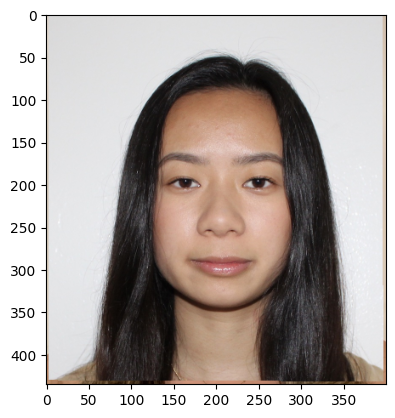

In [40]:
a = total_frames[44]
# plt.imshow(a)
# skio.imsave('/Users/amrita/cs194-26/proj3/gif/44.jpg', a)

In [41]:
path = '/Users/amrita/cs194-26/proj3/frontalshapes_manuallyannotated_46points/35a.pts'
def read_pts(filename):
    return np.loadtxt(filename, comments=("version:", "n_points:", "{", "}"))

In [42]:

_1a = np.loadtxt("1a.txt")
_2a = np.loadtxt("2a.txt")
_3a = np.loadtxt("3a.txt")
_4a = np.loadtxt("4a.txt")
_5a = np.loadtxt("5a.txt")
_6a = np.loadtxt("6a.txt")
_7a = np.loadtxt("7a.txt")
_8a = np.loadtxt("8a.txt")
_9a = np.loadtxt("9a.txt")
_10a = np.loadtxt("10a.txt")
_11a = np.loadtxt("11a.txt")
_12a = np.loadtxt("12a.txt")
_13a = np.loadtxt("13a.txt")
_14a = np.loadtxt("14a.txt")
_15a = np.loadtxt("15a.txt")
_16a = np.loadtxt("16a.txt")
_17a = np.loadtxt("17a.txt")
_18a = np.loadtxt("18a.txt")
_19a = np.loadtxt("19a.txt")
_20a = np.loadtxt("20a.txt")
_21a = np.loadtxt("21a.txt")
_22a = np.loadtxt("22a.txt")
_23a = np.loadtxt("23a.txt")
_24a = np.loadtxt("24a.txt")
_25a = np.loadtxt("25a.txt")
_26a = np.loadtxt("26a.txt")
_27a = np.loadtxt("27a.txt")
_28a = np.loadtxt("28a.txt")
_29a = np.loadtxt("29a.txt")
_30a = np.loadtxt("30a.txt")
_31a = np.loadtxt("31a.txt")
_32a = np.loadtxt("32a.txt")
_33a = np.loadtxt("33a.txt")
_34a = np.loadtxt("34a.txt")
_35a = np.loadtxt("35a.txt")


In [43]:
face_pts = [_1a, _2a, _3a, _4a, _5a, _6a,_7a, _8a, _9a,_10a, _11a, _12a,_13a, _14a, _15a,_16a, _17a, _18a,_19a, _20a, _21a,_22a, _23a, _24a, _25a, _26a,_27a, _28a, _29a,_30a, _31a, _32a,_33a,_34a, _35a]
# face_pts

In [44]:
def mean_points(arr):
    mean_arr = [[0]*2]*50
    for i in range(len(arr)):
        mean_arr += arr[i]
    for i in range(len(mean_arr)):
        mean_arr[i][0] = (mean_arr[i][0])/35
        mean_arr[i][1] = (mean_arr[i][1])/35
    return mean_arr

mean_pts = mean_points(face_pts)
# mean_pts

In [45]:
im_1a = skio.imread("frontalimages_spatiallynormalized_part1/1a.jpg")
im_2a = skio.imread("frontalimages_spatiallynormalized_part1/2a.jpg")
im_3a = skio.imread("frontalimages_spatiallynormalized_part1/3a.jpg")
im_4a = skio.imread("frontalimages_spatiallynormalized_part1/4a.jpg")
im_5a = skio.imread("frontalimages_spatiallynormalized_part1/5a.jpg")
im_6a = skio.imread("frontalimages_spatiallynormalized_part1/6a.jpg")
im_7a = skio.imread("frontalimages_spatiallynormalized_part1/7a.jpg")
im_8a = skio.imread("frontalimages_spatiallynormalized_part1/8a.jpg")
im_9a = skio.imread("frontalimages_spatiallynormalized_part1/9a.jpg")
im_10a = skio.imread("frontalimages_spatiallynormalized_part1/10a.jpg")
im_11a = skio.imread("frontalimages_spatiallynormalized_part1/11a.jpg")
im_12a = skio.imread("frontalimages_spatiallynormalized_part1/12a.jpg")
im_13a = skio.imread("frontalimages_spatiallynormalized_part1/13a.jpg")
im_14a = skio.imread("frontalimages_spatiallynormalized_part1/14a.jpg")
im_15a = skio.imread("frontalimages_spatiallynormalized_part1/15a.jpg")
im_16a = skio.imread("frontalimages_spatiallynormalized_part1/16a.jpg")
im_17a = skio.imread("frontalimages_spatiallynormalized_part1/17a.jpg")
im_18a = skio.imread("frontalimages_spatiallynormalized_part1/18a.jpg")
im_19a = skio.imread("frontalimages_spatiallynormalized_part1/19a.jpg")
im_20a = skio.imread("frontalimages_spatiallynormalized_part1/20a.jpg")
im_21a = skio.imread("frontalimages_spatiallynormalized_part1/21a.jpg")
im_22a = skio.imread("frontalimages_spatiallynormalized_part1/22a.jpg")
im_23a = skio.imread("frontalimages_spatiallynormalized_part1/23a.jpg")
im_24a = skio.imread("frontalimages_spatiallynormalized_part1/24a.jpg")
im_25a = skio.imread("frontalimages_spatiallynormalized_part1/25a.jpg")
im_26a = skio.imread("frontalimages_spatiallynormalized_part1/26a.jpg")
im_27a = skio.imread("frontalimages_spatiallynormalized_part1/27a.jpg")
im_28a = skio.imread("frontalimages_spatiallynormalized_part1/28a.jpg")
im_29a = skio.imread("frontalimages_spatiallynormalized_part1/29a.jpg")
im_30a = skio.imread("frontalimages_spatiallynormalized_part1/30a.jpg")
im_31a = skio.imread("frontalimages_spatiallynormalized_part1/31a.jpg")
im_32a = skio.imread("frontalimages_spatiallynormalized_part1/32a.jpg")
im_33a = skio.imread("frontalimages_spatiallynormalized_part1/33a.jpg")
im_34a = skio.imread("frontalimages_spatiallynormalized_part1/34a.jpg")
im_35a = skio.imread("frontalimages_spatiallynormalized_part1/35a.jpg")

face_img = [im_1a, im_2a, im_3a, im_4a, im_5a, im_6a,im_7a, im_8a, im_9a,im_10a, im_11a, im_12a,im_13a, im_14a,im_15a,im_16a, im_17a, im_18a,im_19a, im_20a, im_21a,im_22a, im_23a, im_24a, im_25a, im_26a,im_27a, im_28a, im_29a,im_30a, im_31a, im_32a,im_33a,im_34a, im_35a]


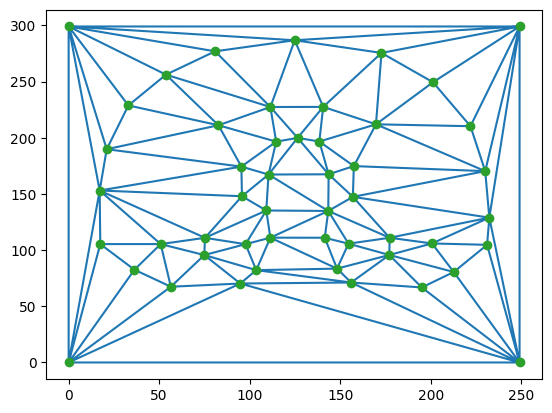

In [46]:
mean_tri = Delaunay(mean_pts)
plt.triplot(mean_pts[:,0], mean_pts[:,1], mean_tri.simplices)
mid = plt.plot(mean_pts[:,0], mean_pts[:,1], 'o')
plt.show()

In [49]:
orig_triangles_arr = []
mean_triangles = mean_pts[mean_tri.simplices]
for face in face_pts:
    orig_triangles_arr.append(face[mean_tri.simplices])
    
orig_triangles_arr 

[array([[[ 27.4096, 150.904 ],
         [  0.    , 299.    ],
         [  0.    ,   0.    ]],
 
        [[249.    ,   0.    ],
         [ 98.4663,  77.1425],
         [  0.    ,   0.    ]],
 
        [[127.259 , 266.114 ],
         [249.    , 299.    ],
         [  0.    , 299.    ]],
 
        [[249.    , 299.    ],
         [224.398 , 123.795 ],
         [249.    ,   0.    ]],
 
        [[ 82.3548, 256.939 ],
         [127.259 , 266.114 ],
         [  0.    , 299.    ]],
 
        [[ 98.4663,  77.1425],
         [ 62.2628,  72.4371],
         [  0.    ,   0.    ]],
 
        [[ 62.2628,  72.4371],
         [ 41.7868,  84.5564],
         [  0.    ,   0.    ]],
 
        [[ 23.9126, 104.441 ],
         [ 27.4096, 150.904 ],
         [  0.    ,   0.    ]],
 
        [[ 41.7868,  84.5564],
         [ 23.9126, 104.441 ],
         [  0.    ,   0.    ]],
 
        [[149.461 ,  78.36  ],
         [ 98.4663,  77.1425],
         [249.    ,   0.    ]],
 
        [[191.416 ,  70.0301],
         

In [50]:
#35 source matrices with 1 destination matrix

#compute transition matrices for each of the triangles for 35 frames (source -> destination)

orig_transform = [] #holds 35 arrays of len 73 arrays for each triangle
for i in range(len(orig_triangles_arr)): #iterate 0-34 frames
    orig_intermed = []
    for j in range(len(orig_triangles_arr[i])): #iterate through number of triangles in each frame
        orig_intermed.append(compute_affine(orig_triangles_arr[i][j], mean_triangles[j]))
    orig_transform.append(orig_intermed)
    
orig_transform

[[array([[0.62527093, 0.077464  , 0.        ],
         [0.        , 1.        , 0.        ],
         [0.        , 0.        , 1.        ]]),
  array([[ 1.        ,  0.        ,  0.        ],
         [-0.04754663,  0.91082318,  0.        ],
         [ 0.        ,  0.        ,  1.        ]]),
  array([[ 1.00000000e+00,  0.00000000e+00,  0.00000000e+00],
         [ 7.32087471e-02,  3.72986334e-01,  0.00000000e+00],
         [-2.18894154e+01,  1.87477086e+02,  1.00000000e+00]]),
  array([[ 6.78529039e-01, -2.07258411e-01,  4.45872701e-19],
         [-6.53337402e-17,  1.00000000e+00, -4.12239185e-35],
         [ 8.00462692e+01,  5.16073444e+01,  1.00000000e+00]]),
  array([[ 9.80085505e-01,  7.97546019e-02,  0.00000000e+00],
         [-3.85440036e-03,  6.81612828e-01,  0.00000000e+00],
         [ 1.15246571e+00,  9.51977645e+01,  1.00000000e+00]]),
  array([[ 1.07863414, -0.04751451,  0.        ],
         [-0.14791688,  0.97147169,  0.        ],
         [ 0.        ,  0.        ,  1.  

In [51]:
#compute inverse transition matrices for each of the 94 triangles for 35 frames (source -> destination)

orig_inverses = []
for i in range(len(orig_transform)):
    orig_inv = []
    for j in range(len(orig_transform[i])):
        orig_inv.append(np.linalg.inv(orig_transform[i][j]))
    orig_inverses.append(orig_inv)


In [52]:
#get points in each triangle in mean triangulation
pts_inside_mean_triangle = []
for i in range(len(mean_triangles)):
    pts_inside_mean_triangle.append(get_inside_pts(mean_triangles[i]))


In [53]:
#append 1 to each of the points within the triangles
for i in range(len(pts_inside_mean_triangle)): #loops through all triangles 1-94
    for j in range(len(pts_inside_mean_triangle[i])): #loops through all tuples within the array
            pts_inside_mean_triangle[i][j] = [pts_inside_mean_triangle[i][j][0],pts_inside_mean_triangle[i][j][1],1]


In [54]:
#make points inside avg triangle into matrix we can multiply by transformation matrix
stacked_mean_pts = []
for i in pts_inside_mean_triangle:
    stacked_mean_pts.append(np.stack(i))


In [55]:
#multiply points in mean triangles by inverse matrix of each triangle in each image to get orig pixel location 

orig_pixels = [] #has 35 arrays with points in each orig image

for i in range(len(orig_inverses)):
    orig_inter = []
    for j in range(len(orig_inverses[i])):
        inv = orig_inverses[i][j]
        orig_inter.append(np.dot(stacked_mean_pts[j], inv))
    orig_pixels.append(orig_inter)


In [56]:
#interpolate function for grayscale images
def interpolate_bw(im):
    value = RectBivariateSpline(np.arange(im.shape[0]), np.arange(im.shape[1]), im)
    return value

In [57]:
warped_faces = [] #35 warped faces

f = [interpolate_bw(face) for face in face_img]

for i in range(len(orig_pixels)): #loops 0-34 faces
    person = face_img[i]
    frame = person.copy()
    for j in range(len(orig_pixels[i])): #loops through number of triangles in each face
        forward = orig_transform[i][j]    #get inverse matrix for each triangle in each face
        for k in range(len(orig_pixels[i][j])): 
            
            mean_pixel_loc = np.rint(np.dot(orig_pixels[i][j][k], forward))

            mean_x = mean_pixel_loc[0]
            mean_y = mean_pixel_loc[1]
                        
            func = f[i]
            val = func(orig_pixels[i][j][k][1], orig_pixels[i][j][k][0])
        
            frame[int(mean_y)][int(mean_x)] = val

    warped_faces.append(frame)
    print(len(warped_faces))


1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35


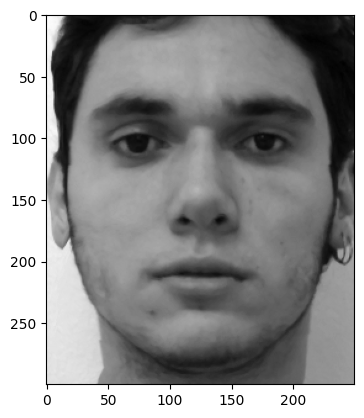

In [58]:
warp = warped_faces[6]
plt.imshow(warp, cmap = "gray")
# skio.imsave('/Users/amrita/cs194-26/proj3/warped7a.jpg', warp)

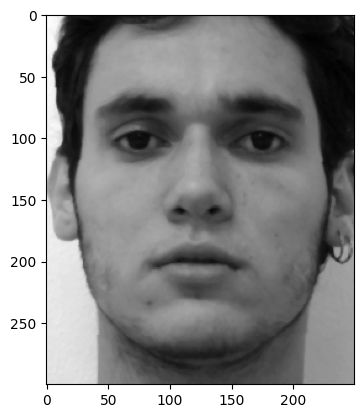

In [59]:
plt.imshow(im_7a, cmap = "gray")

# skio.imsave('/Users/amrita/cs194-26/proj3/11a.jpg', im_11a)

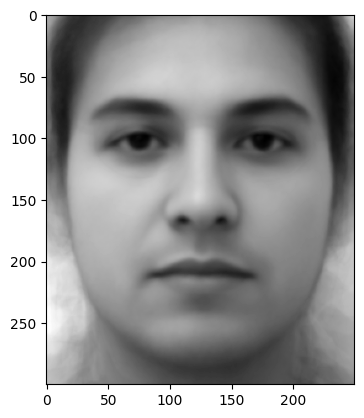

In [60]:
#take average of all warped faces

matrix_avg = np.zeros((300,250)) 

for face in warped_faces:
    for y in range(300):
        for x in range(250):
            matrix_avg[y][x] += (face[y][x])/35
    
plt.imshow(matrix_avg, cmap = "gray")
# skio.imsave('/Users/amrita/cs194-26/proj3/mean_face.jpg', matrix_avg)

In [61]:
# %matplotlib tk

In [63]:
from skimage.color import rgb2gray

han_gs = rgb2gray(han)
# plt.imshow(han_gs, cmap = "gray")
# han_gs_pts = np.asarray(plt.ginput(50, timeout = 0))
np.loadtxt("han_pts.txt")
# plt.close()
# np.savetxt("han_gs_pts.txt", han_gs_pts)
han_gs_pts = np.loadtxt("han_gs_pts.txt")

In [64]:
%matplotlib inline

In [65]:
han_triangles = han_gs_pts[mean_tri.simplices]

In [67]:
transform = [] #holds 35 arrays of len 94 arrays for each triangle
for i in range(len(han_triangles)): #iterate through number of triangles in each frame
    transform.append(compute_affine(han_triangles[i], mean_triangles[i]))


In [68]:
inverses = []
for i in range(len(transform)):
    inverses.append(np.linalg.inv(transform[i]))

In [69]:
han_pixels = [] #has 35 arrays with points in each orig image

for i in range(len(inverses)):
    han_pixels.append(np.dot(stacked_mean_pts[i], inverses[i]))


In [71]:
f = interpolate_bw(han_gs)

frame = han_gs.copy()
for i in range(len(han_pixels)): #loops through all the triangles
    forward = transform[i]    #get inverse matrix for each triangle in each face
    for j in range(len(han_pixels[i])): 
            
        han_pixel_loc = np.rint(np.dot(han_pixels[i][j], forward))

        han_x = han_pixel_loc[0]
        han_y = han_pixel_loc[1]
                        
        val = f(han_pixels[i][j][1], han_pixels[i][j][0])
        
        frame[int(han_y)][int(han_x)] = val
        
frame = frame[:300, :250]
# skio.imsave('/Users/amrita/cs194-26/proj3/han_to_mean.jpg', frame)

In [73]:
han_gs_ = han_gs[50:375, 70:320]
han_resize = cv2.resize(han_gs_, (250, 300))

In [74]:
%matplotlib tk

In [75]:
# plt.imshow(han_resize, cmap = "gray")
# han_resize_pts = np.asarray(plt.ginput(50, timeout = 0))
han_resize_pts = np.loadtxt("han_resize_pts.txt")
# plt.close()
# np.savetxt("han_resize_pts.txt", han_resize_pts)


In [183]:
%matplotlib inline

In [76]:
han_tri = Delaunay(han_resize_pts)
han_triangles = han_resize_pts[han_tri.simplices]


In [78]:
matrix_triangles = mean_pts[han_tri.simplices]

In [79]:
transform = [] #holds 35 arrays of len 94 arrays for each triangle
for i in range(len(matrix_triangles)): #iterate through number of triangles in each frame
    transform.append(compute_affine(matrix_triangles[i], han_triangles[i]))
    

In [80]:
inverses = []
for i in range(len(transform)):
    inverses.append(np.linalg.inv(transform[i]))

In [81]:
#get points in each triangle in han triangulation
pts_inside_han_triangle = []
for i in range(len(han_triangles)):
    pts_inside_han_triangle.append(get_inside_pts(han_triangles[i]))


In [83]:
#append 1 to each of the points within the triangles
for i in range(len(pts_inside_han_triangle)): #loops through all triangles
    for j in range(len(pts_inside_han_triangle[i])): 
            pts_inside_han_triangle[i][j] = [pts_inside_han_triangle[i][j][0],pts_inside_han_triangle[i][j][1],1]


In [84]:
#make points inside avg triangle into matrix we can multiply by transformation matrix
stacked_han_pts = []
for i in pts_inside_han_triangle:
    stacked_han_pts.append(np.stack(i))


In [85]:
matrix_pixels = [] #has 35 arrays with points in each orig image

for i in range(len(inverses)):
    matrix_pixels.append(np.dot(stacked_han_pts[i], inverses[i]))


In [87]:
f = interpolate_bw(matrix_avg)

frame = han_resize.copy()
for i in range(len(matrix_pixels)): #loops through all the triangles
    forward = transform[i]    #get inverse matrix for each triangle 
    for j in range(len(matrix_pixels[i])): #get each original point
            
        mean_pixel_loc = np.rint(np.dot(matrix_pixels[i][j], forward))

        x = mean_pixel_loc[0]
        y = mean_pixel_loc[1]
            
        val = f(matrix_pixels[i][j][1], matrix_pixels[i][j][0])
        frame[int(y)][int(x)] = val
        
plt.imshow(frame, cmap = "gray")
# skio.imsave('/Users/amrita/cs194-26/proj3/mean_to_han.jpg', frame)

In [88]:
alpha = 0.5
diff = han_resize_pts - mean_pts
diff
caric_pts = han_resize_pts + alpha*diff

In [89]:
caric_tri = Delaunay(caric_pts)
caric_triangles = caric_pts[caric_tri.simplices]

array([[[ 61.41380994, 178.72712154],
        [  1.2282483 , 297.1391768 ],
        [  1.2282483 ,   1.59137881]],

       [[204.3767485 , 141.57135694],
        [189.88434119, 103.86038093],
        [247.4465602 ,   0.66226024]],

       [[ 61.27245732,  99.82011377],
        [ 61.41380994, 178.72712154],
        [  1.2282483 ,   1.59137881]],

       [[ 61.27245732,  99.82011377],
        [ 66.82416411, 144.95745553],
        [ 61.41380994, 178.72712154]],

       [[142.68311512, 122.43020393],
        [111.09361627, 124.02928393],
        [121.07037487, 115.11876243]],

       [[216.77016571, 200.08495016],
        [204.3767485 , 141.57135694],
        [247.4465602 ,   0.66226024]],

       [[246.51744162, 298.06829538],
        [216.77016571, 200.08495016],
        [247.4465602 ,   0.66226024]],

       [[215.11773855, 210.98839603],
        [216.77016571, 200.08495016],
        [246.51744162, 298.06829538]],

       [[197.82259702, 243.02347915],
        [172.85591969, 260.6257507

In [90]:
hannah_triangles = han_resize_pts[caric_tri.simplices]


In [91]:
transform = [] #holds arrays for each triangle
for i in range(len(hannah_triangles)): #iterate through number of triangles in each frame
    transform.append(compute_affine(hannah_triangles[i], caric_triangles[i]))
    

In [92]:
inverses = []
for i in range(len(transform)):
    inverses.append(np.linalg.inv(transform[i]))

In [93]:
#get points in each triangle in han triangulation
pts_inside_caric_triangle = []
for i in range(len(caric_triangles)):
    pts_inside_caric_triangle.append(get_inside_pts(caric_triangles[i]))


In [94]:
#append 1 to each of the points within the triangles
for i in range(len(pts_inside_caric_triangle)): #loops through all triangles 1-73
    for j in range(len(pts_inside_caric_triangle[i])): #loops through all tuples within the array
            pts_inside_caric_triangle[i][j] = [pts_inside_caric_triangle[i][j][0],pts_inside_caric_triangle[i][j][1],1]


In [95]:
#make points inside avg triangle into matrix we can multiply by transformation matrix
stacked_caric_pts = []
for i in pts_inside_caric_triangle:
    stacked_caric_pts.append(np.stack(i))


In [96]:
hannah_pixels = [] #has 35 arrays with points in each orig image

for i in range(len(inverses)):
    hannah_pixels.append(np.dot(stacked_caric_pts[i], inverses[i]))


In [97]:
f = interpolate_bw(han_resize)

frame = han_resize.copy()
for i in range(len(hannah_pixels)): #loops through all the triangles
    forward = transform[i]    #get inverse matrix for each triangle 
    for j in range(len(hannah_pixels[i])):
            
        caric_pixel_loc = np.rint(np.dot(hannah_pixels[i][j], forward))

        x = caric_pixel_loc[0]
        y = caric_pixel_loc[1]
            
        val = f(hannah_pixels[i][j][1], hannah_pixels[i][j][0])
        frame[int(y)][int(x)] = val
        
plt.imshow(frame, cmap = "gray")
# skio.imsave('/Users/amrita/cs194-26/proj3/han_caricature2.jpg', frame)

In [98]:
mexican_man = skio.imread("avgmexicanman.jpg")/255
mexican_man = cv2.resize(mexican_man, (400, 435))


In [99]:
%matplotlib tk

In [101]:
# plt.imshow(mexican_man)
# man_pts = np.asarray(plt.ginput(71, timeout = 0))
man_pts = np.loadtxt("man_pts.txt")

# plt.close()
# np.savetxt("man_pts.txt", man_pts)

In [102]:
# %matplotlib inline

In [103]:
#getting colors from man and morphing on hannah
pts1_tri = Delaunay(pts1)
pts1_triangles = pts1[pts1_tri.simplices]

man_triangles = man_pts[pts1_tri.simplices]

In [106]:
man_transform = []
for i in range(len(pts1_triangles)):
    man_transform.append(compute_affine(man_triangles[i], pts1_triangles[i]))
# man_transform

In [107]:
man_inverses = []
for i in range(len(man_transform)):
    man_inverses.append(np.linalg.inv(man_transform[i]))

In [108]:
#get points in each hannah triangle
pts_inside_pts1_triangle = []
for i in range(len(pts1_triangles)):
    pts_inside_pts1_triangle.append(get_inside_pts(pts1_triangles[i]))


In [110]:
#append 1 to each of the points within the triangles
for i in range(len(pts_inside_pts1_triangle)): #loops through all triangle arrays
    for j in range(len(pts_inside_pts1_triangle[i])): 
        pts_inside_pts1_triangle[i][j] = [pts_inside_pts1_triangle[i][j][0],pts_inside_pts1_triangle[i][j][1],1]
        

In [113]:
#make points inside avg triangle into matrix we can multiply by transformation matrix
stacked_arrays = []
for i in pts_inside_pts1_triangle: 
    stacked_arrays.append(np.stack(i))


In [114]:
#multiply points in avg triangles by inverse matrix of each triangle for pts1 and pts2 to get orig pixel location 
orig_pixel_man = []
for i in range(len(stacked_arrays)):
    inv = man_inverses[i]
    orig_pixel_man.append(np.dot(stacked_arrays[i], inv))

In [115]:
def interpolate_man(im1):
    (R1, G1, B1) = cv2.split(im1)
    f_R1channel = RectBivariateSpline(np.arange(im1.shape[0]), np.arange(im1.shape[1]), R1)
    f_G1channel = RectBivariateSpline(np.arange(im1.shape[0]), np.arange(im1.shape[1]), G1)
    f_B1channel = RectBivariateSpline(np.arange(im1.shape[0]), np.arange(im1.shape[1]), B1)
    return f_R1channel, f_G1channel, f_B1channel

In [116]:
f_R1 ,f_R2 ,f_G1= interpolate_man(mexican_man)

In [117]:
total_frames = []

for i in range(45):
    img = han.copy()
    for j in range(len(orig_pixel_man)):
        for k in range(len(orig_pixel_man[j])):

            forward_transf = man_transform[j]
            pixel_location = np.rint(np.dot(orig_pixel_man[j][k], forward_transf))

    # #pixel locations to add the color to in midpoint image
            pixel_x = pixel_location[0]
            pixel_y = pixel_location[1]
    # #call each interpolation function on x, y coord for all the points mapped to in both original images
            r1, g1, b1 = f_R1(orig_pixel_man[j][k][1], orig_pixel_man[j][k][0]), f_G1(orig_pixel_man[j][k][1], orig_pixel_man[j][k][0]), f_B1(orig_pixel_man[j][k][1], orig_pixel_man[j][k][0])
            
            r2 = img[int(pixel_y)][int(pixel_x)][0]
            g2 = img[int(pixel_y)][int(pixel_x)][1]
            b2 = img[int(pixel_y)][int(pixel_x)][2]
    # #take avg of pixel colors        
            img[int(pixel_y)][int(pixel_x)][0] = r2*(1-interval[i]) + r1*(interval[i])
            img[int(pixel_y)][int(pixel_x)][1] = g2*(1-interval[i]) + g1*(interval[i])
            img[int(pixel_y)][int(pixel_x)][2] = b2*(1-interval[i]) + b1*(interval[i])
    
    
    total_frames.append(img)
    print(len(total_frames))
        


1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45


In [118]:
b = total_frames[44]
plt.imshow(b)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


In [119]:
btwn_pts_arr = []
btwn_triangles_arr = []
pts1_triangles_arr = []
man_triangles_arr = []
for warp_frac in interval:
    btwn_pts = weighted_points(pts1, man_pts, warp_frac)
    btwn_pts_arr.append(btwn_pts)
    btwn_tri = Delaunay(btwn_pts)
    btwn_triangles_arr.append(btwn_pts[btwn_tri.simplices])
    pts1_triangles_arr.append(pts1[btwn_tri.simplices])
    man_triangles_arr.append(man_pts[btwn_tri.simplices])

# btwn_pts_arr

In [120]:
#compute transition matrices for each of the triangles in pts1 and man for 45 frames (source -> destination)

pts1_transformed = [] #holds 45 arrays of len 136 arrays for each triangle
man_transformed = [] #holds 45 arrays of len 136 arrays for each triangle
for i in range(len(btwn_triangles_arr)): #iterate 0-44 frames
    pts1_intermed = []
    man_intermed = []
    for j in range(len(btwn_triangles_arr[i])): #iterate through number of triangles in each frame
        pts1_intermed.append(compute_affine(pts1_triangles_arr[i][j], btwn_triangles_arr[i][j]))
        man_intermed.append(compute_affine(man_triangles_arr[i][j], btwn_triangles_arr[i][j]))
    pts1_transformed.append(pts1_intermed)
    man_transformed.append(man_intermed)

In [121]:
#get inverses of transformation matrices for pts 1 and man for 45 frames(destination -> source)
pts1_inverses = []
man_inverses = []
for i in range(len(pts1_transformed)):
    pts1_inv = []
    man_inv = []
    for j in range(len(pts1_transformed[i])):
        pts1_inv.append(np.linalg.inv(pts1_transformed[i][j]))
        man_inv.append(np.linalg.inv(man_transformed[i][j]))
    pts1_inverses.append(pts1_inv)
    man_inverses.append(man_inv)


In [122]:
#get points in each in between triangle for 45 frames
pts_inside_btwn_triangle = []
for i in range(len(btwn_triangles_arr)):
    inside_pts = []
    for j in range(len(btwn_triangles_arr[i])):
        inside_pts.append(get_inside_pts(btwn_triangles_arr[i][j]))
    pts_inside_btwn_triangle.append(inside_pts)


In [123]:
#append 1 to each of the points within the triangles
for i in range(len(pts_inside_btwn_triangle)): #loops through all arrays 1-45
    for j in range(len(pts_inside_btwn_triangle[i])): #loops through all triangles within the array
        for k in range(len(pts_inside_btwn_triangle[i][j])):
            pts_inside_btwn_triangle[i][j][k] = [pts_inside_btwn_triangle[i][j][k][0],pts_inside_btwn_triangle[i][j][k][1],1]
        

In [124]:
#make points inside avg triangle into matrix we can multiply by transformation matrix
stacked_arrays = []
for i in range(len(pts_inside_btwn_triangle)):
    stack_inter = []
    for j in range(len(pts_inside_btwn_triangle[i])):
        stack_inter.append(np.stack(pts_inside_btwn_triangle[i][j]))
    stacked_arrays.append(stack_inter)

In [125]:
#get original pixel location of man and hannah
orig_pts1 = []
orig_man = []
for i in range(len(stacked_arrays)):
    pts1_inter = []
    man_inter = []
    for j in range(len(stacked_arrays[i])):
        inv = pts1_inverses[i][j]
        inv2 = man_inverses[i][j]
        pts1_inter.append(np.dot(stacked_arrays[i][j], inv))
        man_inter.append(np.dot(stacked_arrays[i][j], inv2))
    orig_pts1.append(pts1_inter)
    orig_man.append(man_inter)
print(orig_pts1[0][0])


[[  6.   2.   1.]
 [  7.   2.   1.]
 [  8.   2.   1.]
 ...
 [211.  35.   1.]
 [212.  35.   1.]
 [213.  35.   1.]]


In [126]:
#morph hannah and man shape and color
total_frames = []
f_R1 ,f_R2 ,f_G1 ,f_G2 ,f_B1 ,f_B2 = interpolate(han, mexican_man)

for i in range(len(orig_pts1)): #loops 0-44
    frame = han.copy()
    for j in range(len(orig_pts1[i])): #loops through number of triangles
        forward_matrix = pts1_transformed[i][j]
        for k in range(len(orig_pts1[i][j])): #get each original point in first image
            btwn_pixel_loc = np.rint(np.dot(orig_pts1[i][j][k], forward_matrix))
                            
            loc_x = btwn_pixel_loc[0]
            loc_y = btwn_pixel_loc[1]

            r1, g1, b1 = f_R1(orig_pts1[i][j][k][1], orig_pts1[i][j][k][0]), f_G1(orig_pts1[i][j][k][1], orig_pts1[i][j][k][0]), f_B1(orig_pts1[i][j][k][1], orig_pts1[i][j][k][0])
            r2, g2, b2 = f_R2(orig_man[i][j][k][1], orig_man[i][j][k][0]), f_G2(orig_man[i][j][k][1], orig_man[i][j][k][0]), f_B2(orig_man[i][j][k][1], orig_man[i][j][k][0])
        
            frame[int(loc_y)][int(loc_x)][0] = r1*(1-interval[i]) + r2*(interval[i])
            frame[int(loc_y)][int(loc_x)][1] = g1*(1-interval[i]) + g2*(interval[i])
            frame[int(loc_y)][int(loc_x)][2] = b1*(1-interval[i]) + b2*(interval[i])
    total_frames.append(frame)
    print(len(total_frames))

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45


In [127]:
b = total_frames[23]
plt.imshow(b)
# skio.imsave('/Users/amrita/cs194-26/proj3/gif3/23.jpg', b)